# **Setting Up !**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install fastkml

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 930.5 kB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pygeoif: filename=pygeoif-0.7-py3-none-any.whl size=19000 sha256=0d929fe3117ae04705a1ce74fe3fb8c2db11dc828fea46bda95561dfc6a994a4
  Stored in directory: /root/.cache/pip/wheels/22/24/2c/811afb826232cb08e23a7a5e889bcf1edf3dd12ed37914b7d1
Successfully built pygeoif


In [ ]:
import pandas as pd
import os
import shutil
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import geopandas as gpd
import folium
from fastkml import kml
import xml.etree.ElementTree as ET
from shapely.geometry import Polygon
from matplotlib import pyplot as plt
import seaborn as sns
import ipywidgets as widgets

# **Functions**

In [ ]:
def rename(folder_path, end_path='/content/data/'):
    for year in range(2022, 2025):
        for quarter in ["Jan to Mar", "Apr to Jun", "Jul to Sep", "Oct to Dec"]:
            old_file_name = f'mental health clinic monthly report {quarter} {year}.csv'
            new_file_name = f'{quarter} {year}.csv'
            old_file_path = os.path.join(folder_path, old_file_name)
            new_file_path = os.path.join(end_path, new_file_name)
            if os.path.exists(old_file_path):
                try:
                    shutil.copy(old_file_path, new_file_path)
                except OSError:
                    print('Opreation failed')

In [ ]:
def load_dataset(folder_path):
    df = []
    for year in range(2022, 2025):
        for quarter, sector in [("Jan to Mar", 1), ("Apr to Jun", 2), ("Jul to Sep", 3), ("Oct to Dec", 4)]:
            file_name = f'{quarter} {year}.csv'
            file_path = os.path.join(folder_path, file_name)
            if os.path.exists(file_path):
                df_quarter = pd.read_csv(file_path)
                df_quarter['Year'] = year
                df_quarter['Sector'] = sector
                df.append(df_quarter)
    return pd.concat(df, ignore_index=True)

In [ ]:
def district_data(df, district_name):
  df_district = df[df['organisationunitname'] == district_name]
  return df_district

In [ ]:
def graph(df, district_name, Y):
    df_district = district_data(df, district_name)
    x = df_district['Year'].astype(str) + '_' + df_district['Sector'].astype(str)
    y = df_district[Y]
    # Convert data to numpy arrays
    x = np.array(x)
    y = np.array(y)

    # Sort X in ascending order
    sorted_indices = np.argsort(x)
    x = x[sorted_indices]
    y = y[sorted_indices]

    # Plot the graph
    plt.plot(x, y)
    plt.xlabel('Year_Sector')
    plt.ylabel(Y)
    plt.title(f'{district_name}')
    plt.grid(True)
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
    plt.show()


In [ ]:
def all_graphs(df, district_name, column_list):
    for Y in column_list:
        df_district = district_data(df, district_name)  # Assuming district_data() is defined elsewhere
        x = df_district['Year'].astype(str) + '_' + df_district['Sector'].astype(str)
        y = df_district[Y]
        # Convert data to numpy arrays
        x = np.array(x)
        y = np.array(y)

        # Sort X in ascending order
        sorted_indices = np.argsort(x)
        x = x[sorted_indices]
        y = y[sorted_indices]

        # Plot the graph with label
        plt.plot(x, y, label=Y)  # Add label to the plot

    plt.xlabel('Year_Sector')
    plt.ylabel('Values')
    plt.title(f'{district_name}')
    plt.grid(True)
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Add legend to the plot
    plt.show()


In [ ]:
def all_graphs_normalised(df, district_name, column_list):
    for Y in column_list:
        df_district = district_data(df, district_name)  # Assuming district_data() is defined elsewhere
        x = df_district['Year'].astype(str) + '_' + df_district['Sector'].astype(str)
        y = df_district[Y]
        # Convert data to numpy arrays
        x = np.array(x)
        y = np.array(y)

        # Normalize y values to range between 0 and 1
        y_normalized = (y - np.min(y)) / (np.max(y) - np.min(y))

        # Sort X in ascending order
        sorted_indices = np.argsort(x)
        x = x[sorted_indices]
        y_normalized = y_normalized[sorted_indices]

        # Plot the graph with label
        plt.plot(x, y_normalized, label=Y)  # Add label to the plot

    plt.xlabel('Year_Sector')
    plt.ylabel('Values')
    plt.title(f'{district_name}')
    plt.grid(True)
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Add legend to the plot
    plt.show()


In [ ]:
# Define the function to update the plot based on dropdown selection
def update_plot(district, Y):
    graph(df, district, Y)

In [ ]:
# Function to calculate health index for each district
def calculate_health_index(row):
    score = 0
    for column, weight in weights.items():
        score += row[column] * weight
    return score

In [ ]:
def parse_kml(kml_file):
    tree = ET.parse(kml_file)
    root = tree.getroot()

    district_data = []
    for placemark in root.findall('.//{http://www.opengis.net/kml/2.2}Placemark'):
        district_name = placemark.findtext('.//{http://www.opengis.net/kml/2.2}name')
        extended_data = placemark.find('.//{http://www.opengis.net/kml/2.2}ExtendedData')
        district_id = extended_data.findtext('.//{http://www.opengis.net/kml/2.2}SimpleData[@name="DISTRICT_L"]')
        state = extended_data.findtext('.//{http://www.opengis.net/kml/2.2}SimpleData[@name="STATE"]')

        coordinates = placemark.find('.//{http://www.opengis.net/kml/2.2}coordinates').text.strip()
        coordinates_list = [tuple(map(float, coord.split(','))) for coord in coordinates.split()]
        polygon = Polygon(coordinates_list)

        district_data.append({
            'district_name': district_name,
            'district_id': district_id,
            'state': state,
            'geometry': polygon
        })

    return pd.DataFrame(district_data)

In [ ]:
def change_district_names(df):
    district_mapping = {
        'Palghar DMHU': 'PALGHAR',
        'Sangli DMHU': 'SANGLI',
        'Mental Hospital Ratnagiri': 'RATNAGIRI',
        'Sindhudurg DMHU': 'SINDHUDURG',
        'Nagpur DMHU': 'NAGPUR',
        'Latur DMHU': 'LATUR',
        'Raigad DMHU': 'RAYGAD',
        'Chandrapur DMHU': 'CHANDRAPUR',
        'Buldhana DMHU': 'BULDHANA',
        'Ahmadnagar DMHU': 'AHAMADNAGAR',
        'Wardha DMHU': 'WARDHA',
        'Mental Hospital Nagpur': 'NAGPUR',
        'Dhule DMHU': 'DHULE',
        'Mental Hospital Pune': 'PUNE',
        'Pune DMHU': 'PUNE',
        'Jalna DMHU': 'JALNA',
        'Parbhani DMHU': 'PARBHANI',
        'Nanded DMHU': 'NANDED',
        'Yeotamal DMHU': 'YAVATMAL',
        'Mental Hospital Thane': 'THANE',
        'Gondia DMHU': 'GONDIA',
        'Nashik DMHU': 'NASHIK',
        'Akola DMHU': 'AKOLA',
        'Washim DMHU': 'WASHIM',
        'Amravati DMHU': 'AMARAVATI',
        'Osmanabad DMHU': 'USMANABAD',
        'Aurangabad DMHU': 'AURANGABAD',
        'Gadchiroli DMHU': 'GADCHIROLI',
        'Beed DMHU': 'BEED',
        'Jalgaon DMHU': 'JALGAON',
        'Kolhapur DMHU': 'KOLHAPUR',
        'Ratnagiri DMHU': 'RATNAGIRI',
        'Solapur DMHU': 'SOLAPUR',
        'Hingoli DMHU': 'HINGOLI',
        'Thane DMHU': 'THANE',
        'Bhandara DMHU': 'BHANDARA',
        'Satara DMHU': 'SATARA',
        'Nandurbar DMHU': 'NANDURBAR'
    }
    df['organisationunitname'] = df['organisationunitname'].map(district_mapping)
    return df

In [ ]:
def assign_district_index(df):
    district_index = {
        'PALGHAR': 665,
        'SANGLI': 493,
        'RATNAGIRI': 492,
        'SINDHUDURG': 495,
        'NAGPUR': 484,
        'LATUR': 481,
        'RAYGAD': 491,
        'CHANDRAPUR': 473,
        'BULDHANA': 472,
        'AHAMADNAGAR': 466,
        'WARDHA': 498,
        'DHULE': 474,
        'PUNE': 490,
        'JALNA': 479,
        'PARBHANI': 489,
        'NANDED': 485,
        'YAVATMAL': 500,
        'THANE': 497,
        'GONDIA': 476,
        'NASHIK': 487,
        'AKOLA': 467,
        'WASHIM': 499,
        'AMARAVATI': 468,
        'USMANABAD': 488,
        'AURANGABAD': 469,
        'GADCHIROLI': 475,
        'BEED': 470,
        'JALGAON': 478,
        'KOLHAPUR': 480,
        'SOLAPUR': 496,
        'HINGOLI': 477,
        'BHANDARA': 471,
        'SATARA': 494,
        'NANDURBAR': 486
    }
    df['district_id'] = df['organisationunitname'].map(district_index)
    return df

In [ ]:
def plot_map(df, year, sector, column):
    df_new = df[(df['Year'] == year) & (df['Sector'] == sector)].copy()   # Fixed the condition
    df_new['district_id'] = df_new['district_id'].astype(int)
    maharashtra_districts['district_id'] = maharashtra_districts['district_id'].astype(int)
    # Assuming you have the 'district_id' column in both 'maharashtra_districts' and 'df'
    # Now merge the DataFrames
    merged_data = pd.merge(maharashtra_districts, df_new, on='district_id')

    # Rest of your code remains unchanged
    gdf = gpd.GeoDataFrame(merged_data, geometry='geometry')

    fig, ax = plt.subplots(figsize=(10, 8))
    gdf.plot(column=column, cmap='viridis', edgecolor='black', legend=True, ax=ax)

    # Adding annotations for district names
    for idx, row in gdf.iterrows():
        ax.annotate(text=row['organisationunitname'], xy=(row['geometry'].centroid.x, row['geometry'].centroid.y),
                    xytext=(3, 3), textcoords="offset points", fontsize=8, color='white',
                    bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))

    # List of districts to annotate
    districts_to_annotate = ['RATNAGIRI', 'SATARA', 'USMANABAD', 'AURANGABAD']

    # The column you want to display along with the district name
    column_to_display = column

    # Loop through each row in your GeoDataFrame
    for idx, row in gdf.iterrows():
        # Check if the current district is in the list of districts to annotate
        if row['organisationunitname'].upper() in districts_to_annotate:
            # Prepare the text you want to annotate (district name and column value)
            text_to_display = f"{row['organisationunitname']}: {row[column_to_display]}"
            # Annotate the district name and specific column value
            ax.annotate(text=text_to_display,
                        xy=(row['geometry'].centroid.x, row['geometry'].centroid.y),
                        xytext=(3, 3), textcoords="offset points", fontsize=8,
                        color='yellow',  # Choosing a color that stands out
                        bbox=dict(facecolor='blue', alpha=0.5, edgecolor='none'))

    # Removing x and y labels
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_title(column)

    # Display the plot
    plt.show()

# **Loading the Dataframe**

In [ ]:
!mkdir "/content/data"

In [ ]:
folder_path = "/content/drive/MyDrive/DH307"
rename(folder_path)

In [ ]:
folder_path = "/content/data"
df = load_dataset(folder_path)

In [ ]:
columns_to_keep = [
    'organisationunitname',
    'common mental disorders out of total opd-phc',
    'severe mental disorders out of total opd-phc',
    'suicidal risks out of outreach opd-phc_nmhp',
    'phcs with functional dmhp clinicopd_nmhp',
    'phcs with availability of psychotropic drugs_nmhp',
    'Year',
    'Sector'
]

In [ ]:
# Drop columns that are not in the list of columns to keep
df = df[columns_to_keep]

In [ ]:
# Define weights for each factor
weights = {
    'common mental disorders out of total opd-phc': -0.1,
    'severe mental disorders out of total opd-phc': -0.5,
    'suicidal risks out of outreach opd-phc_nmhp': -3,
    'phcs with functional dmhp clinicopd_nmhp': 2,
    'phcs with availability of psychotropic drugs_nmhp': 3
}

# Apply the function to each row
df['Health Index'] = df.apply(calculate_health_index, axis=1)

In [ ]:
df = change_district_names(df)

In [ ]:
df = assign_district_index(df)

In [ ]:
df = df.fillna(0)

In [ ]:
district_list = df['organisationunitname'].unique()
y_list = df.columns

print('Districts : ', district_list)
print()
print('Columns : ', y_list)

Districts :  ['PALGHAR' 'SANGLI' 'RATNAGIRI' 'SINDHUDURG' 'NAGPUR' 'LATUR' 'RAYGAD'
 'CHANDRAPUR' 'BULDHANA' 'AHAMADNAGAR' 'WARDHA' 'DHULE' 'PUNE' 'JALNA'
 'PARBHANI' 'NANDED' 'YAVATMAL' 'THANE' 'GONDIA' 'NASHIK' 'AKOLA' 'WASHIM'
 'AMARAVATI' 'USMANABAD' 'AURANGABAD' 'GADCHIROLI' 'BEED' 'JALGAON'
 'KOLHAPUR' 'SOLAPUR' 'HINGOLI' 'BHANDARA' 'SATARA' 'NANDURBAR']

Columns :  Index(['organisationunitname', 'common mental disorders out of total opd-phc',
       'severe mental disorders out of total opd-phc',
       'suicidal risks out of outreach opd-phc_nmhp',
       'phcs with functional dmhp clinicopd_nmhp',
       'phcs with availability of psychotropic drugs_nmhp', 'Year', 'Sector',
       'Health Index', 'district_id'],
      dtype='object')


In [ ]:
maharashtra_districts = parse_kml('/content/drive/MyDrive/DH307_2/maharashtra.kml')

# **Correlation matrix**

In [ ]:
columns_for_corr = [
    'common mental disorders out of total opd-phc',
    'severe mental disorders out of total opd-phc',
    'suicidal risks out of outreach opd-phc_nmhp',
    'phcs with functional dmhp clinicopd_nmhp',
    'phcs with availability of psychotropic drugs_nmhp',
    'Health Index',
]

In [ ]:
df_corr = df[columns_for_corr]

In [ ]:
corr = df_corr.corr()
corr.style.background_gradient(cmap='coolwarm')

,common mental disorders out of total opd-phc,severe mental disorders out of total opd-phc,suicidal risks out of outreach opd-phc_nmhp,phcs with functional dmhp clinicopd_nmhp,phcs with availability of psychotropic drugs_nmhp,Health Index
common mental disorders out of total opd-phc,1.000000,0.304676,0.042137,0.227660,-0.037413,-0.643064
severe mental disorders out of total opd-phc,0.304676,1.000000,0.167358,0.187223,0.242014,-0.548165
suicidal risks out of outreach opd-phc_nmhp,0.042137,0.167358,1.000000,0.127268,0.276319,-0.324930
phcs with functional dmhp clinicopd_nmhp,0.227660,0.187223,0.127268,1.000000,0.442024,0.355997
phcs with availability of psychotropic drugs_nmhp,-0.037413,0.242014,0.276319,0.442024,1.000000,0.271037
Health Index,-0.643064,-0.548165,-0.324930,0.355997,0.271037,1.000000


**A good correlation depends on the use, but it is safe to say you have at least 0.6 (or -0.6) to call it a good correlation**

# **Interactive Graph with Graph of Maharashtr**

In [ ]:
# Define the interactive widgets
district_dropdown = widgets.Dropdown(options=district_list, description='District:')
Y_dropdown = widgets.Dropdown(options=y_list, description='Feature:')

# Connect the dropdowns to the update function
widgets.interactive(update_plot, district=district_dropdown, Y=Y_dropdown)

interactive(children=(Dropdown(description='District:', options=('PALGHAR', 'SANGLI', 'RATNAGIRI', 'SINDHUDURG…

In [ ]:
@widgets.interact
def interactive_plot_map(
    year=widgets.Dropdown(options=[2022, 2023, 2024, 2025], value=2022, description='Year:'),
    sector=widgets.Dropdown(options=[1, 2, 3, 4], value=1, description='Sector:'),
    column=widgets.Dropdown(options=y_list, value=y_list[0], description='Column:')
):
    plot_map(df, year, sector, column)

interactive(children=(Dropdown(description='Year:', options=(2022, 2023, 2024, 2025), value=2022), Dropdown(de…

# **Phcs with availability of psychotropic drugs_nmhp vs Districts**

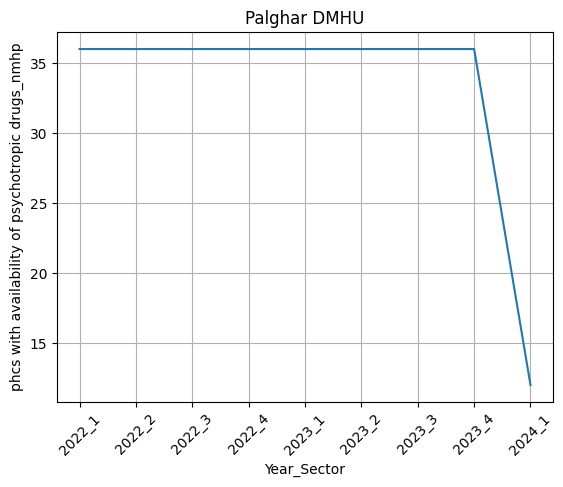

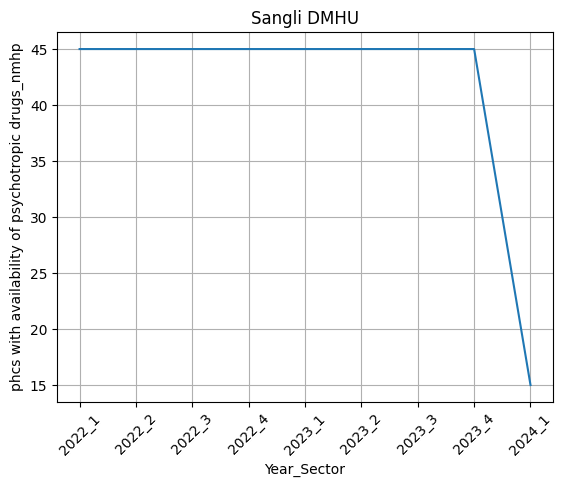

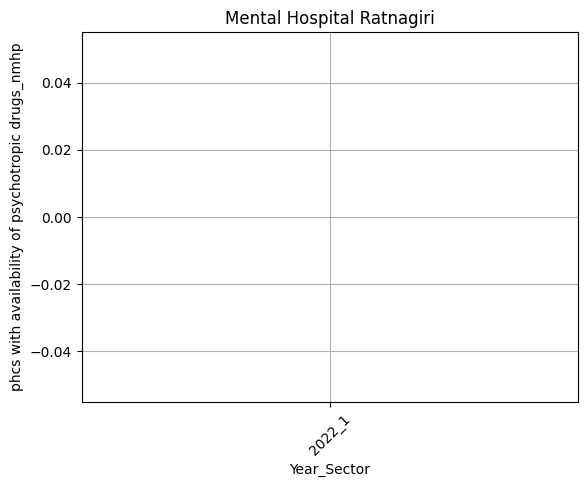

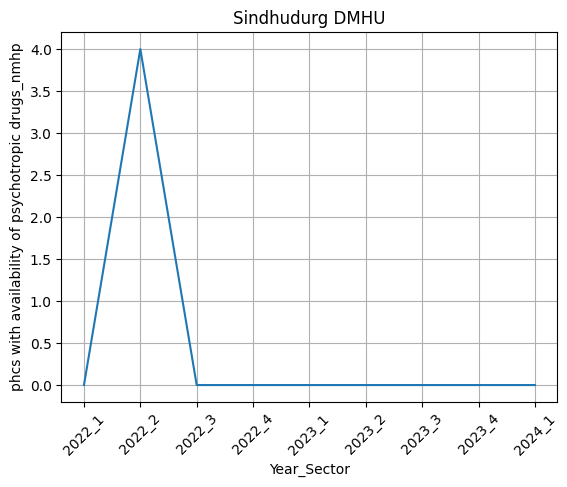

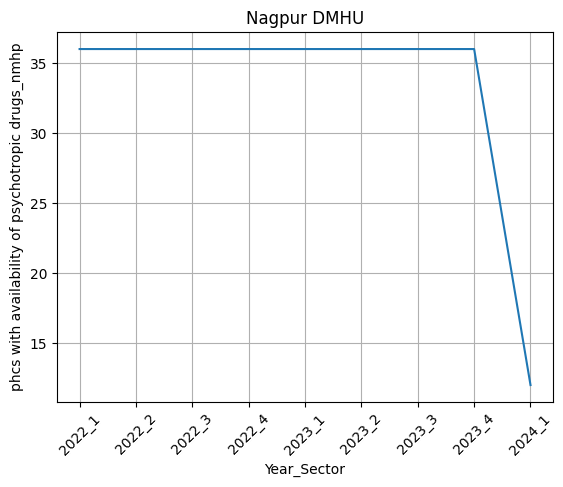

...

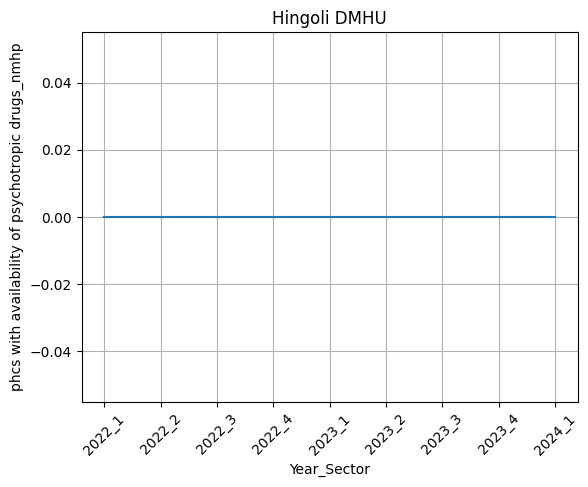

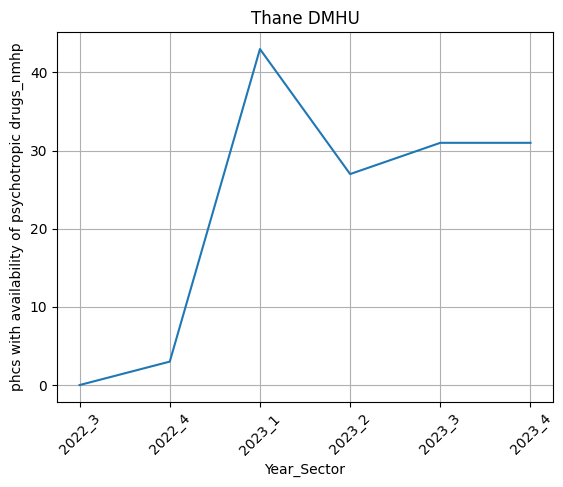

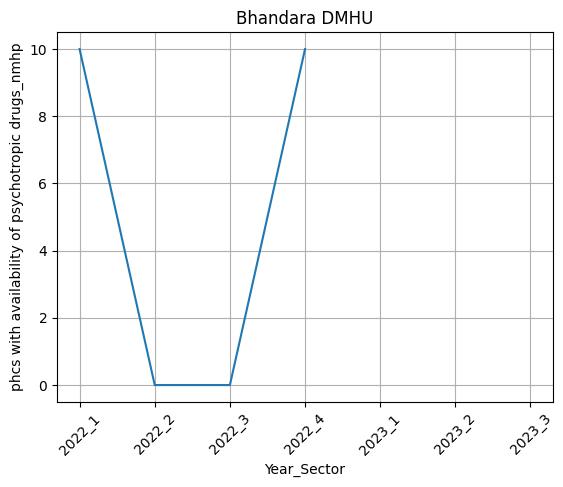

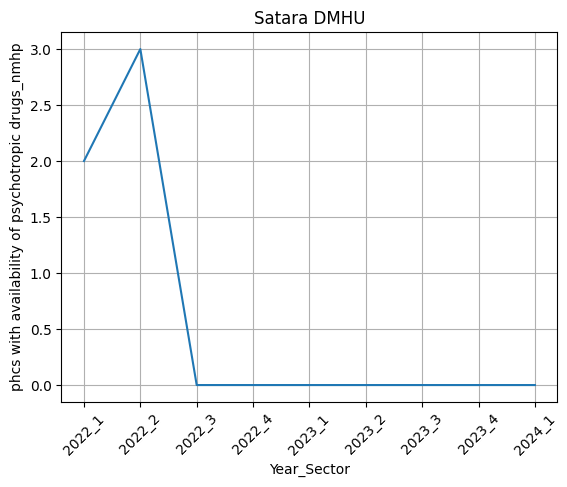

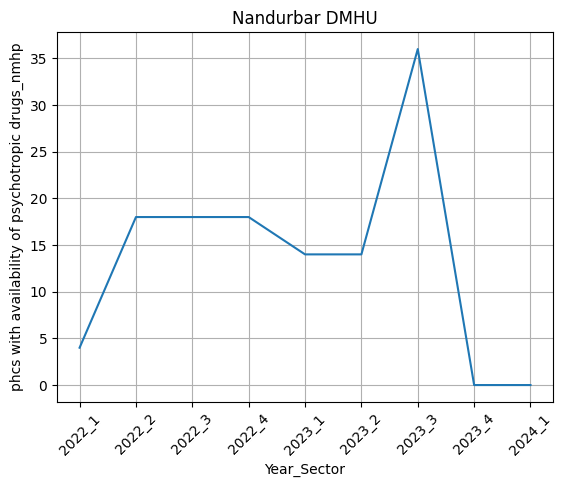

In [ ]:
Y = 'phcs with availability of psychotropic drugs_nmhp'
for district in district_list:
  graph(df, district, Y)

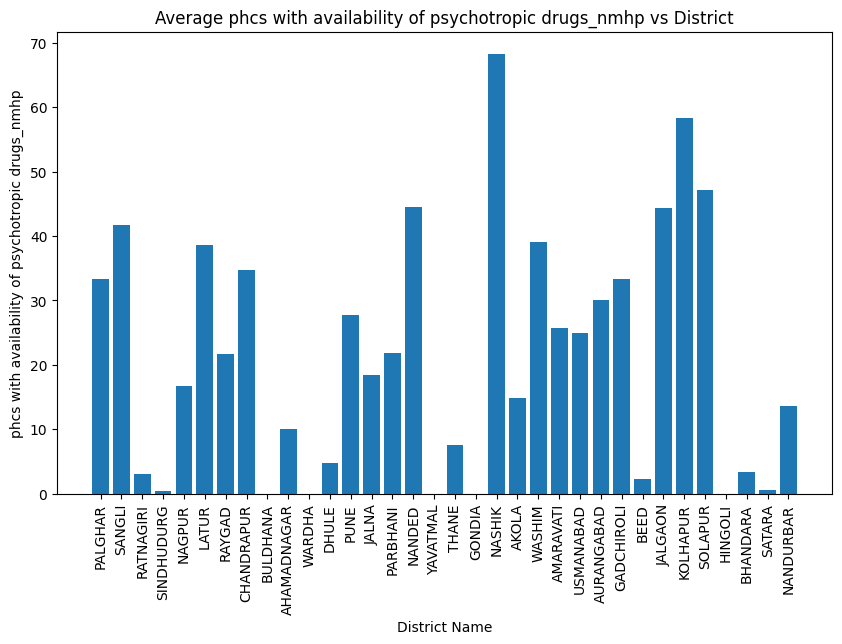

In [ ]:
district_data = {}
for district in district_list:
    df_dist = df[df['organisationunitname'] == district]
    average_value = df_dist['phcs with availability of psychotropic drugs_nmhp'].mean()
    district_data[district] = average_value

district_names = list(district_data.keys())
values = list(district_data.values())

plt.figure(figsize=(10, 6))
plt.bar(district_names, values)
plt.xticks(rotation=90)  # Rotate district names by 90 degrees
plt.xlabel('District Name')
plt.ylabel('phcs with availability of psychotropic drugs_nmhp')
plt.title('Average phcs with availability of psychotropic drugs_nmhp vs District')
plt.show()

# **Phcs with functional dmhp clinicopd_nmhp vs Districts**

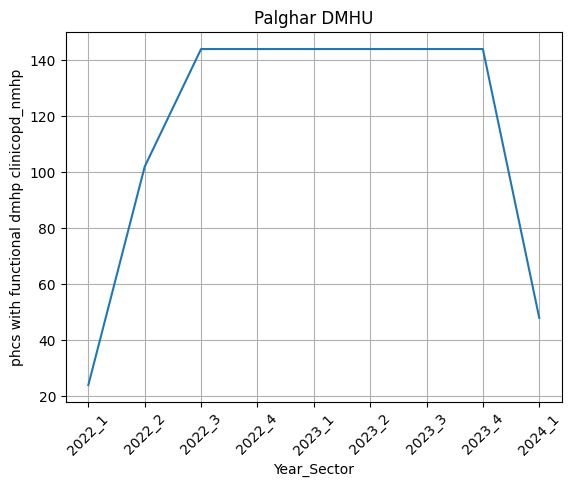

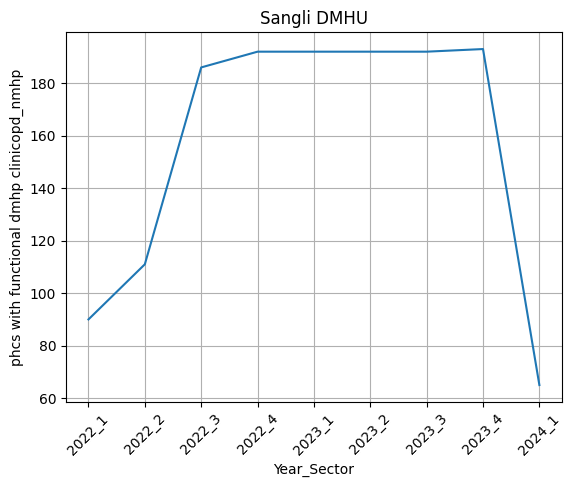

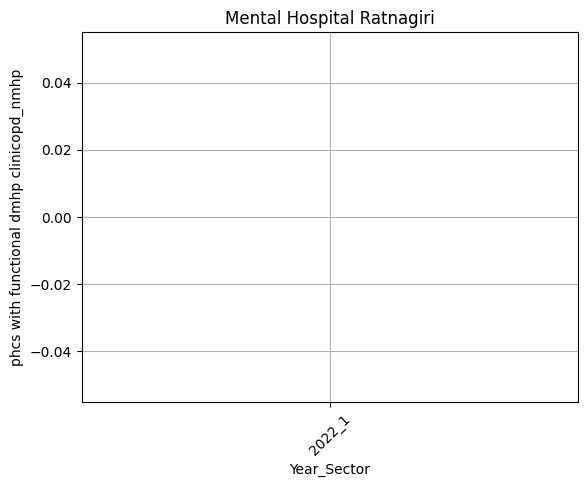

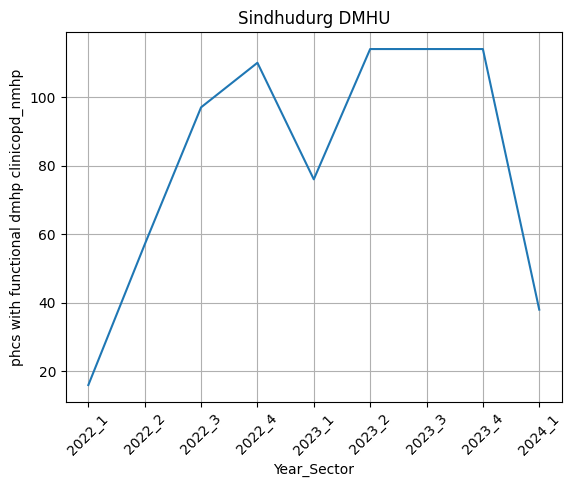

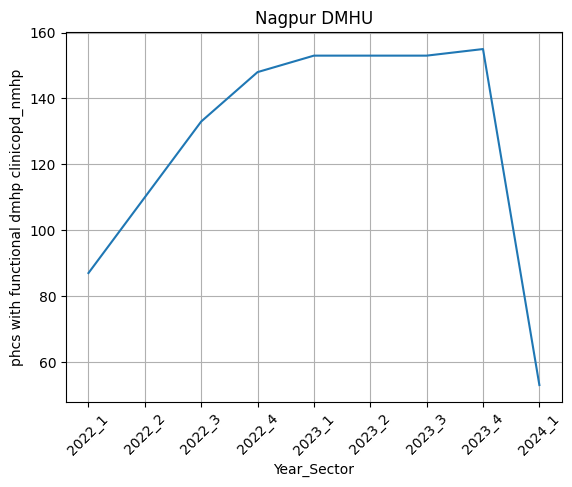

...

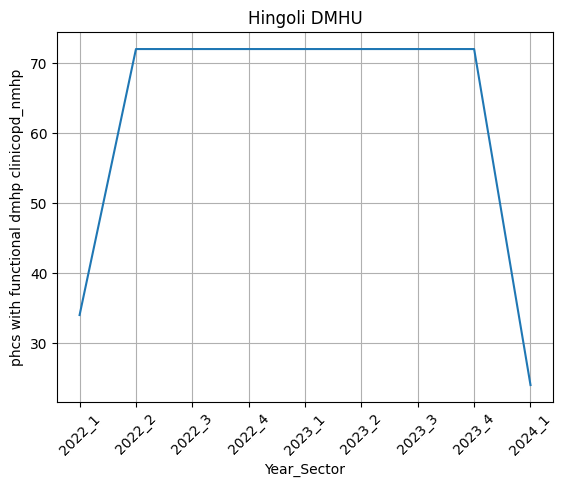

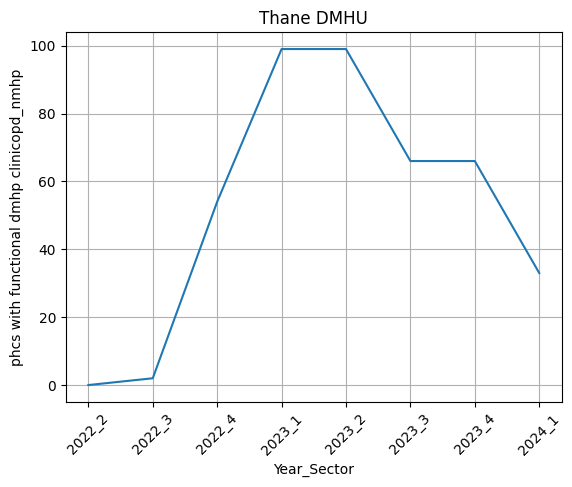

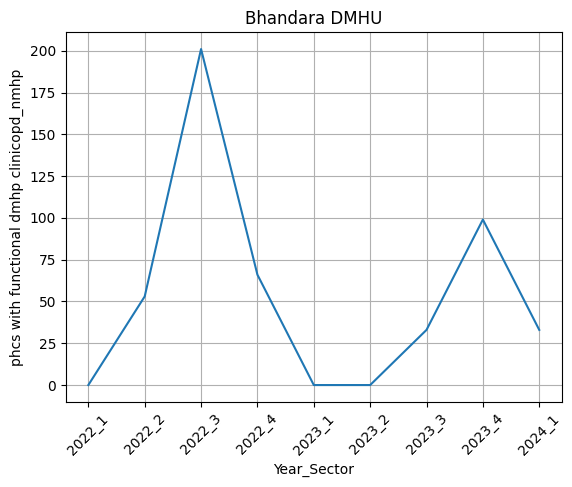

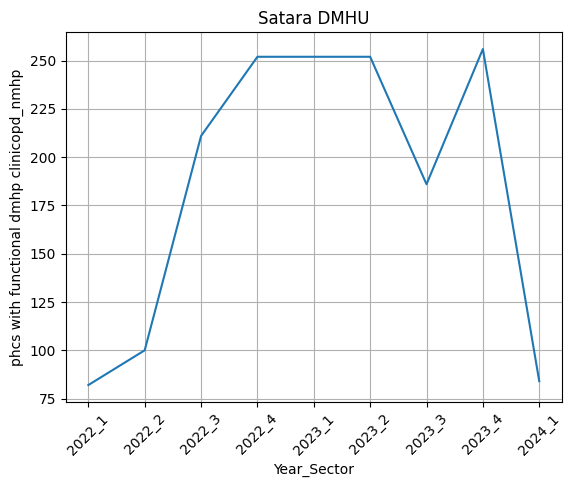

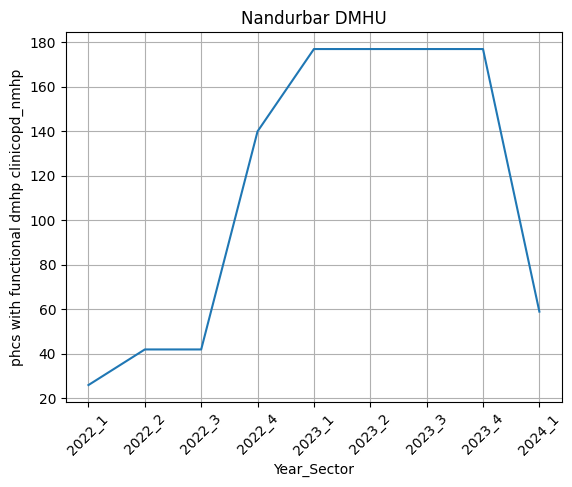

In [ ]:
Y = 'phcs with functional dmhp clinicopd_nmhp'
for district in district_list:
  graph(df, district, Y)

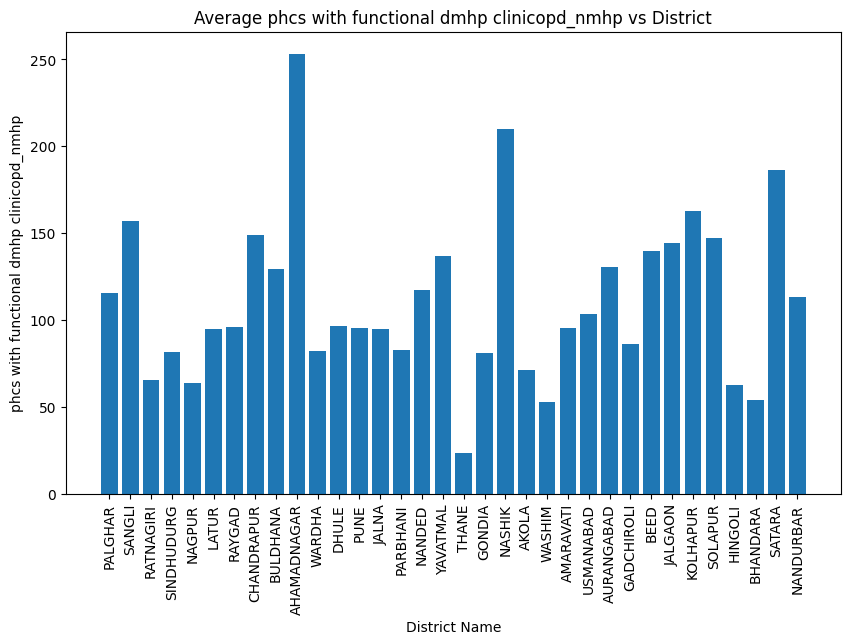

In [ ]:
district_data = {}
for district in district_list:
    df_dist = df[df['organisationunitname'] == district]
    average_value = df_dist['phcs with functional dmhp clinicopd_nmhp'].mean()
    district_data[district] = average_value

district_names = list(district_data.keys())
values = list(district_data.values())

plt.figure(figsize=(10, 6))
plt.bar(district_names, values)
plt.xticks(rotation=90)  # Rotate district names by 90 degrees
plt.xlabel('District Name')
plt.ylabel('phcs with functional dmhp clinicopd_nmhp')
plt.title('Average phcs with functional dmhp clinicopd_nmhp vs District')
plt.show()

# **Common mental disorders out of total opd-phc vs Districts**

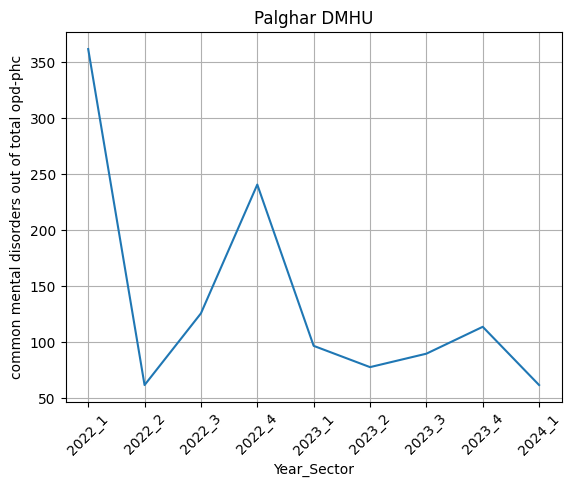

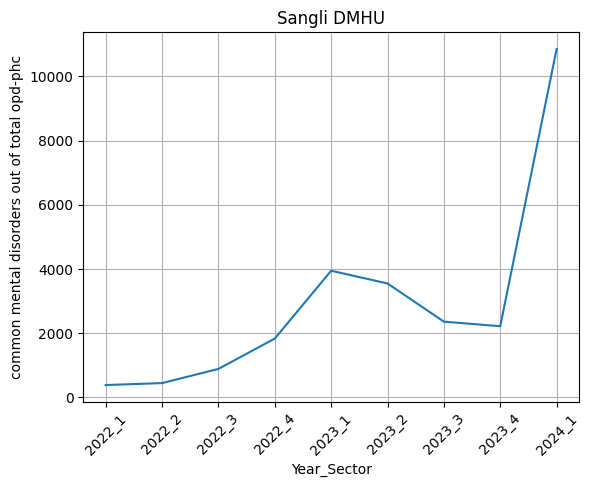

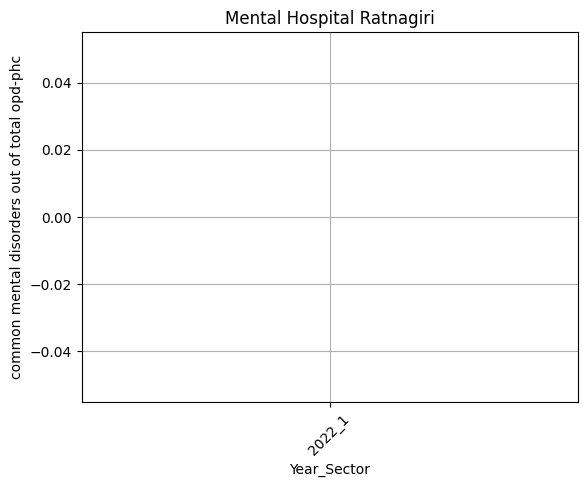

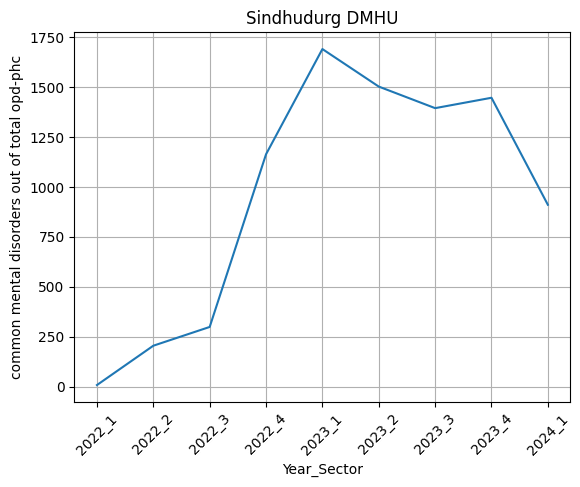

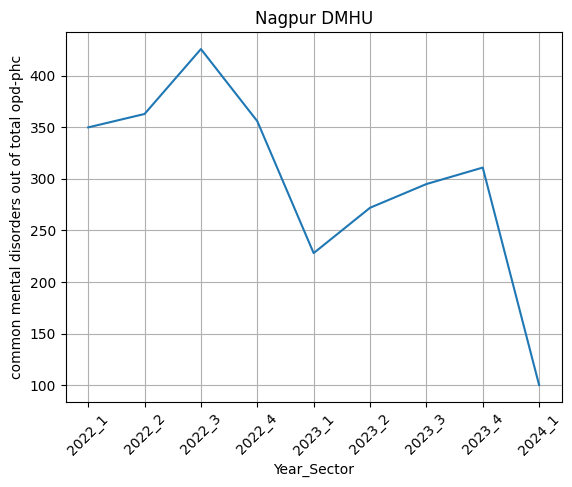

...

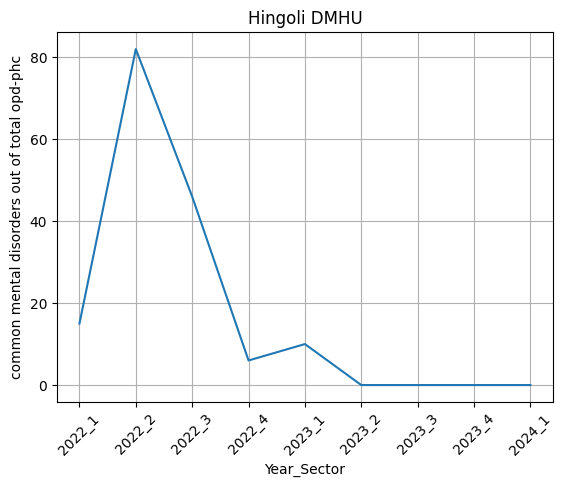

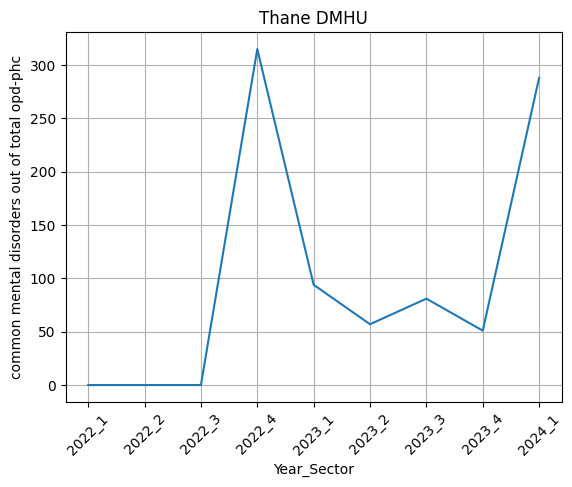

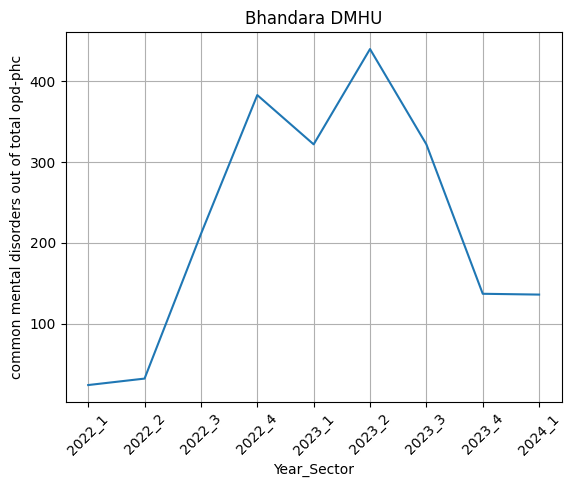

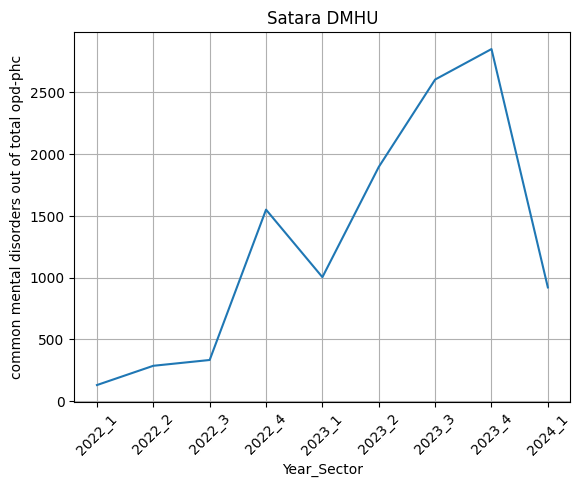

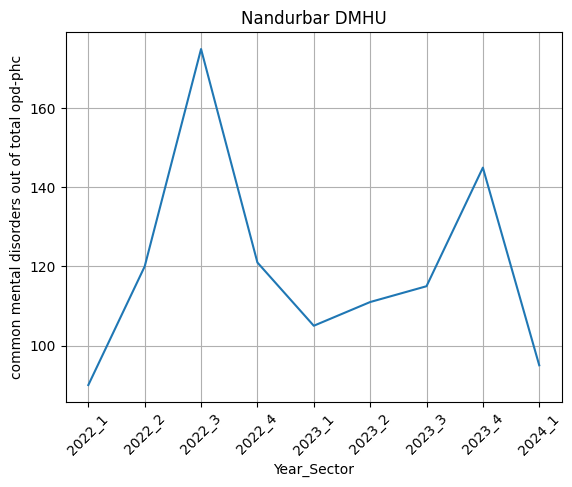

In [ ]:
Y = 'common mental disorders out of total opd-phc'
for district in district_list:
  graph(df, district, Y)

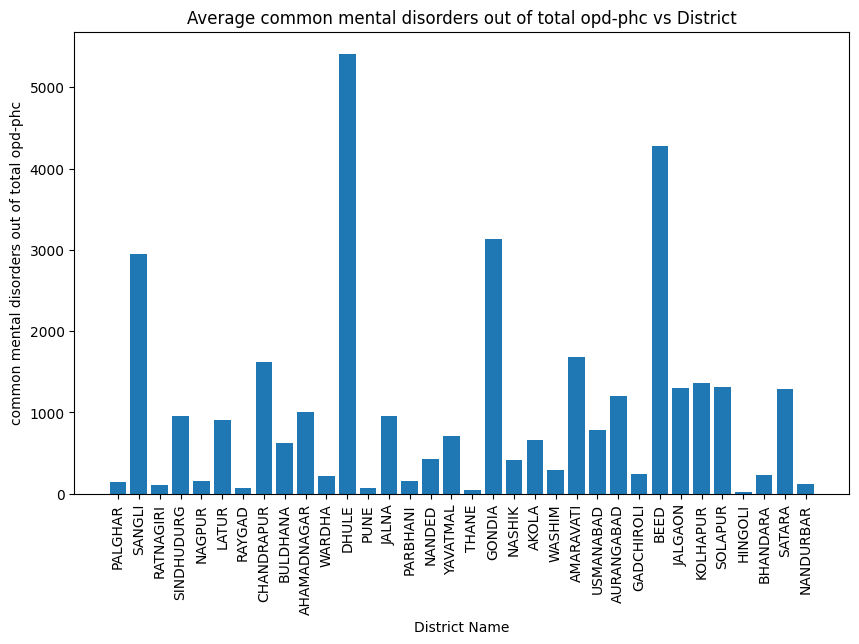

In [ ]:
district_data = {}
for district in district_list:
    df_dist = df[df['organisationunitname'] == district]
    average_value = df_dist['common mental disorders out of total opd-phc'].mean()
    district_data[district] = average_value

district_names = list(district_data.keys())
values = list(district_data.values())

plt.figure(figsize=(10, 6))
plt.bar(district_names, values)
plt.xticks(rotation=90)  # Rotate district names by 90 degrees
plt.xlabel('District Name')
plt.ylabel('common mental disorders out of total opd-phc')
plt.title('Average common mental disorders out of total opd-phc vs District')
plt.show()

# **Severe mental disorders out of total opd-phc vs Districts**

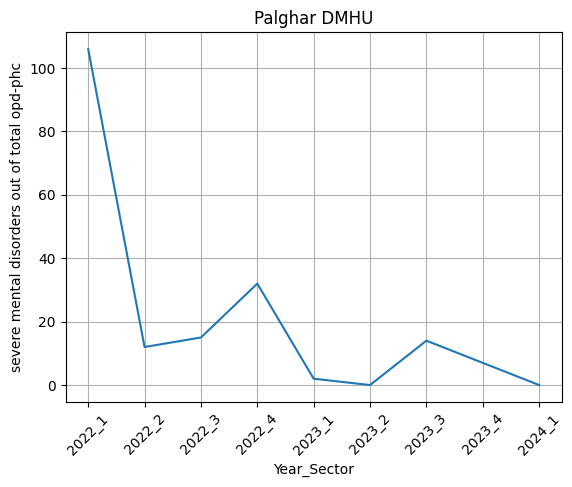

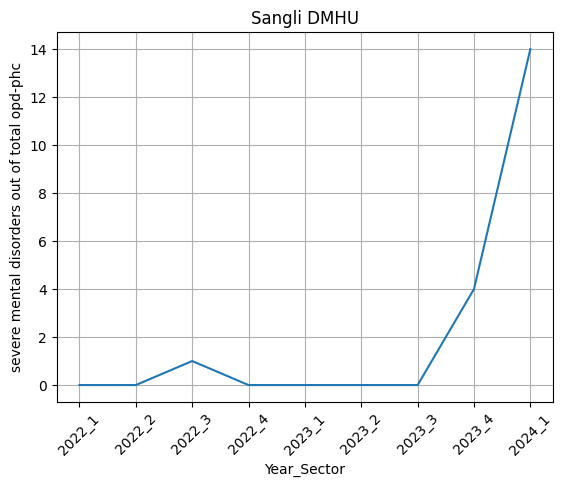

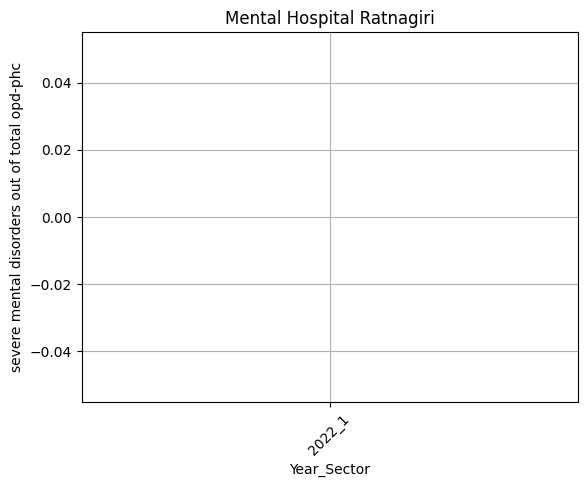

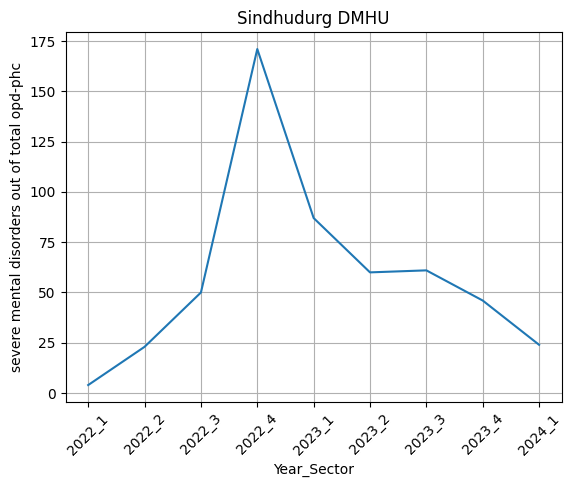

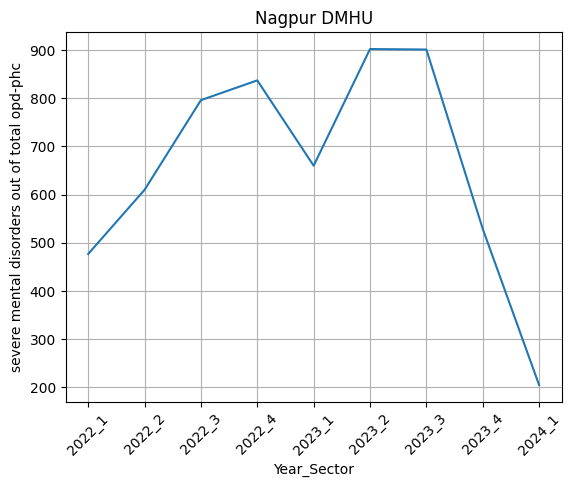

...

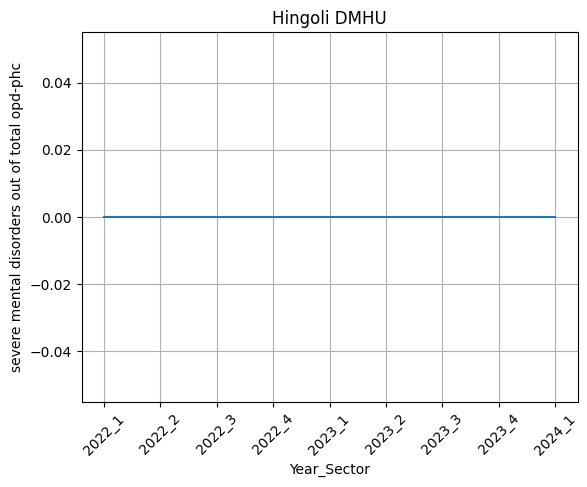

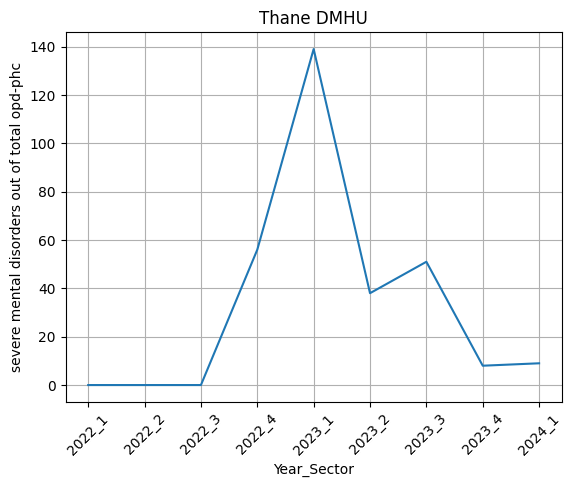

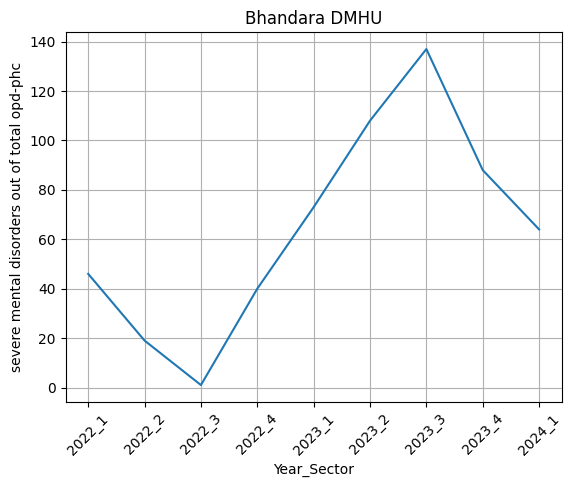

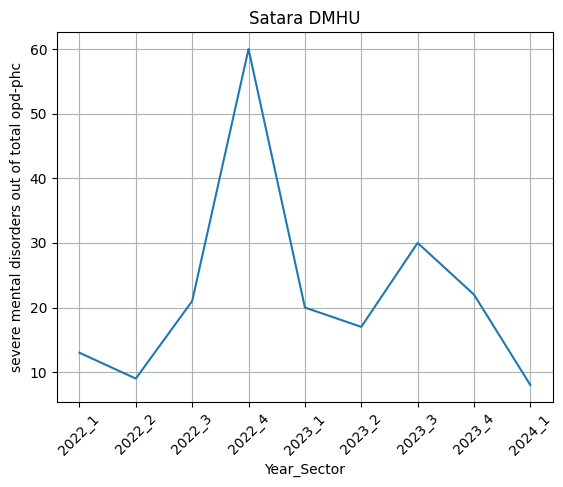

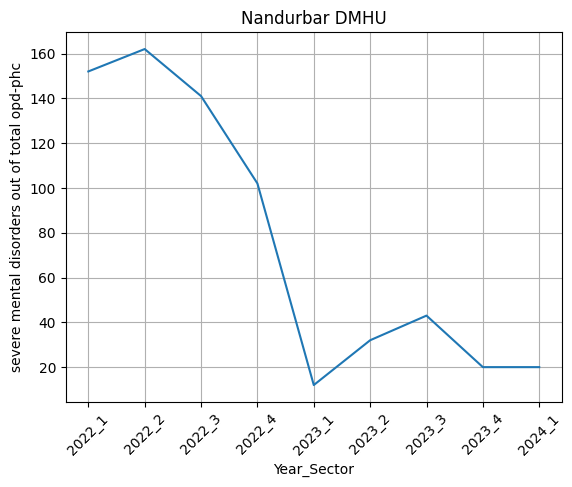

In [ ]:
Y = 'severe mental disorders out of total opd-phc'
for district in district_list:
  graph(df, district, Y)

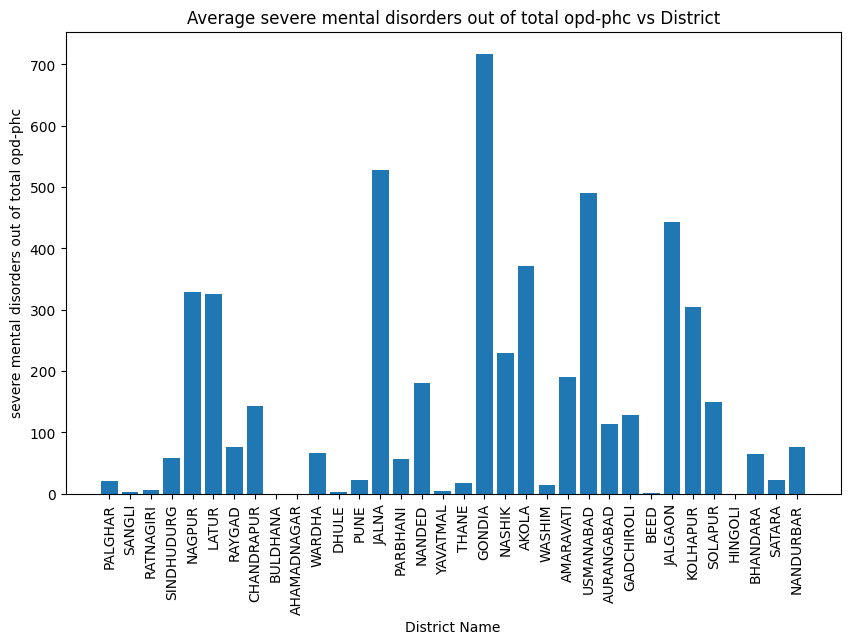

In [ ]:
district_data = {}
for district in district_list:
    df_dist = df[df['organisationunitname'] == district]
    average_value = df_dist['severe mental disorders out of total opd-phc'].mean()
    district_data[district] = average_value

district_names = list(district_data.keys())
values = list(district_data.values())

plt.figure(figsize=(10, 6))
plt.bar(district_names, values)
plt.xticks(rotation=90)  # Rotate district names by 90 degrees
plt.xlabel('District Name')
plt.ylabel('severe mental disorders out of total opd-phc')
plt.title('Average severe mental disorders out of total opd-phc vs District')
plt.show()

# **Suicidal risks out of outreach opd-phc_nmhp vs Districts**

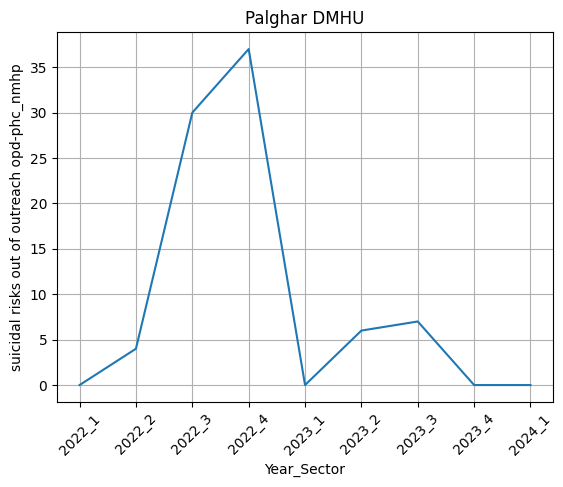

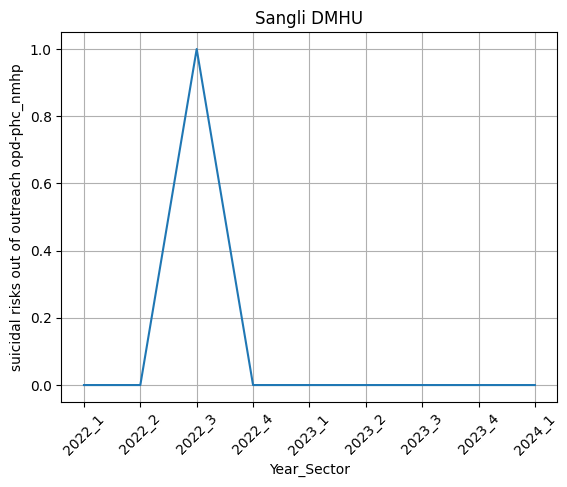

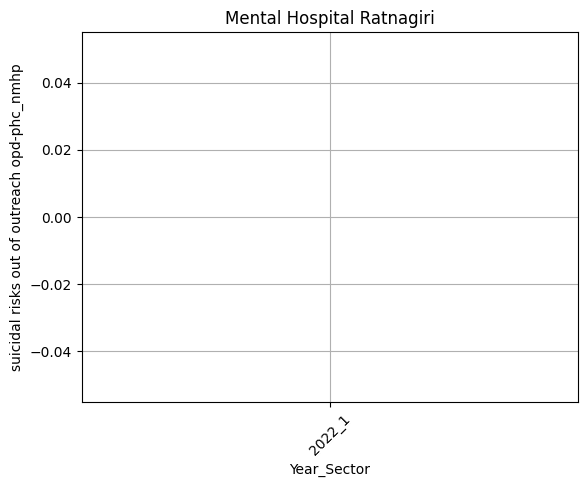

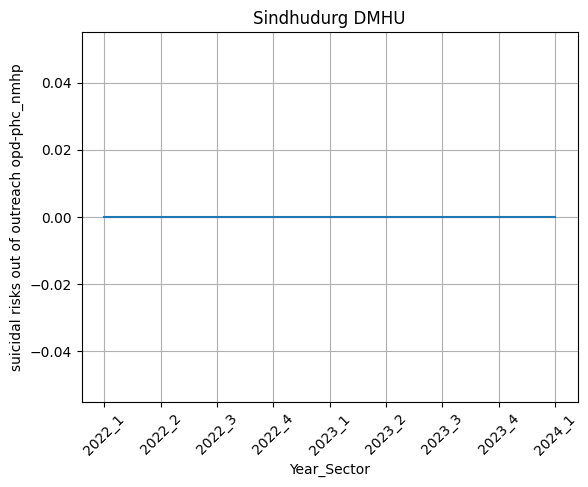

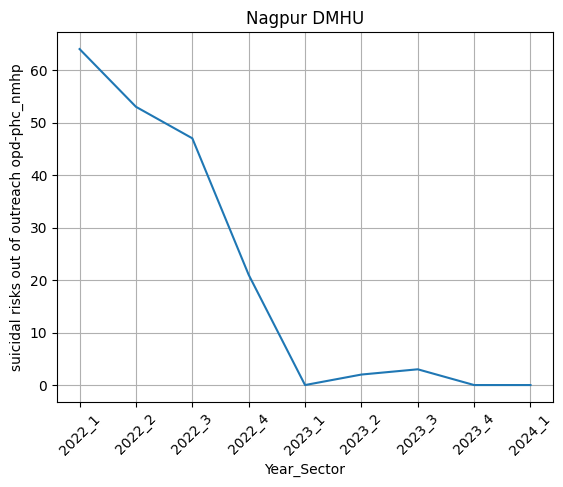

...

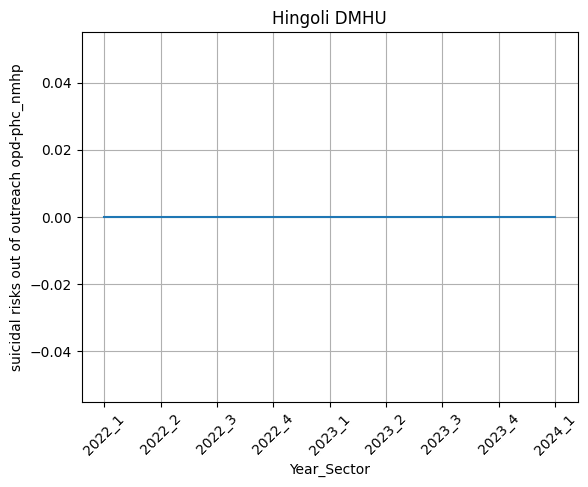

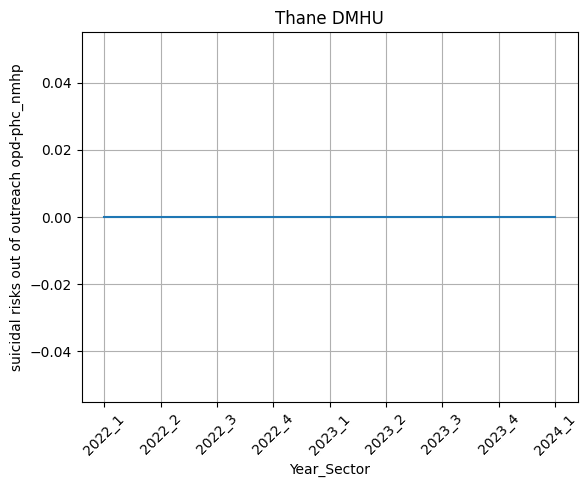

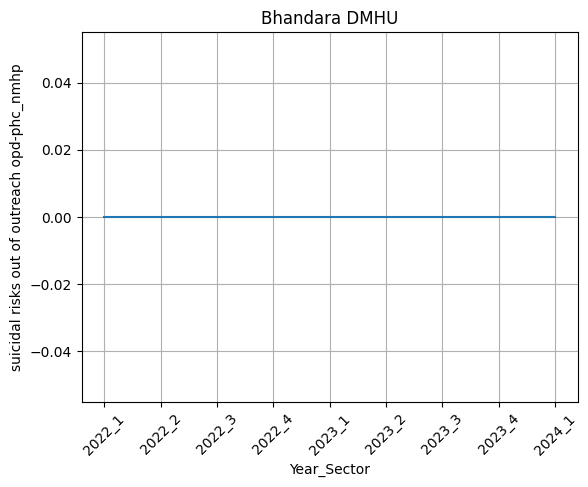

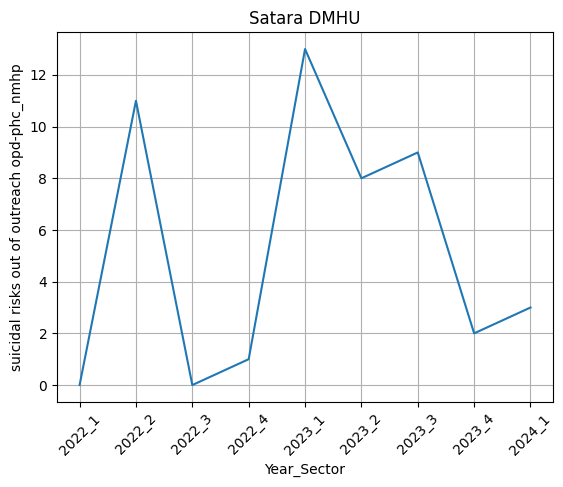

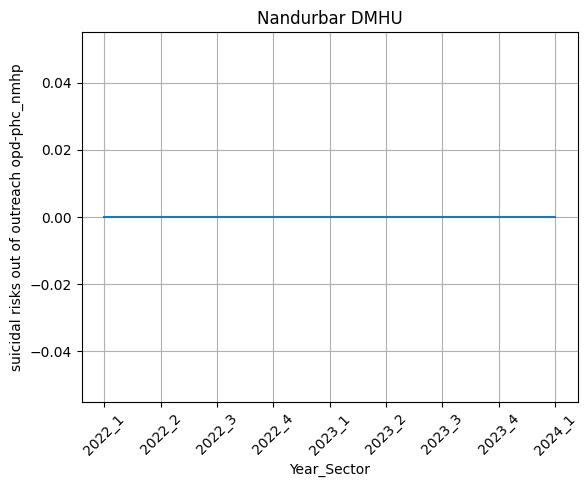

In [ ]:
Y = 'suicidal risks out of outreach opd-phc_nmhp'
for district in district_list:
  graph(df, district, Y)

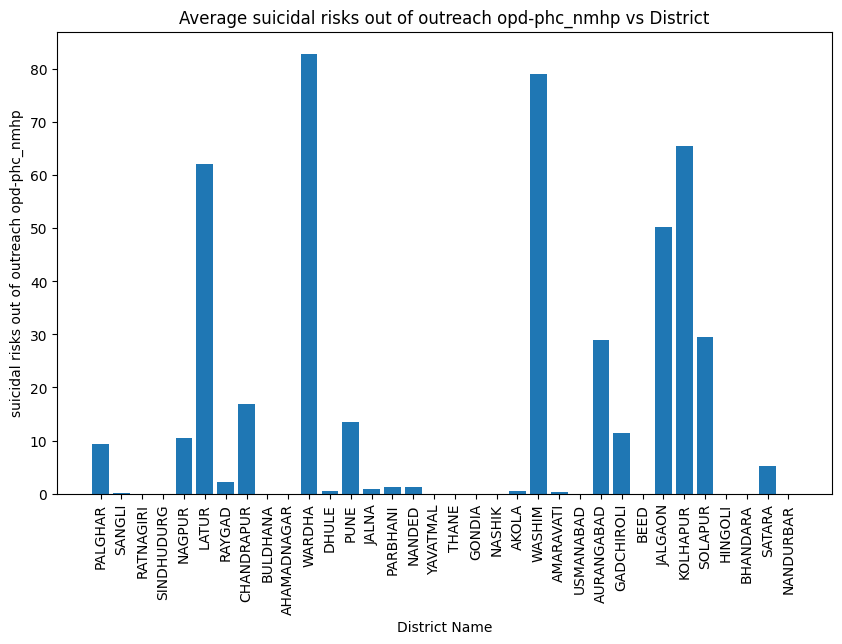

In [ ]:
district_data = {}
for district in district_list:
    df_dist = df[df['organisationunitname'] == district]
    average_value = df_dist['suicidal risks out of outreach opd-phc_nmhp'].mean()
    district_data[district] = average_value

district_names = list(district_data.keys())
values = list(district_data.values())

plt.figure(figsize=(10, 6))
plt.bar(district_names, values)
plt.xticks(rotation=90)  # Rotate district names by 90 degrees
plt.xlabel('District Name')
plt.ylabel('suicidal risks out of outreach opd-phc_nmhp')
plt.title('Average suicidal risks out of outreach opd-phc_nmhp vs District')
plt.show()

# **Health Index**

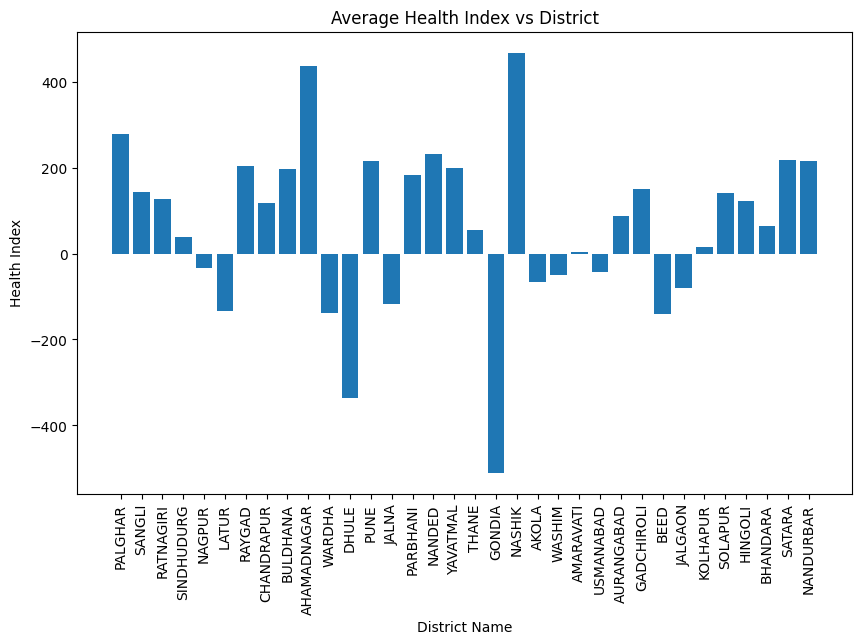

In [ ]:
district_data = {}
for district in district_list:
    df_dist = df[df['organisationunitname'] == district]
    average_value = df_dist['Health Index'].mean()
    district_data[district] = average_value

district_names = list(district_data.keys())
values = list(district_data.values())

plt.figure(figsize=(10, 6))
plt.bar(district_names, values)
plt.xticks(rotation=90)  # Rotate district names by 90 degrees
plt.xlabel('District Name')
plt.ylabel('Health Index')
plt.title('Average Health Index vs District')
plt.show()

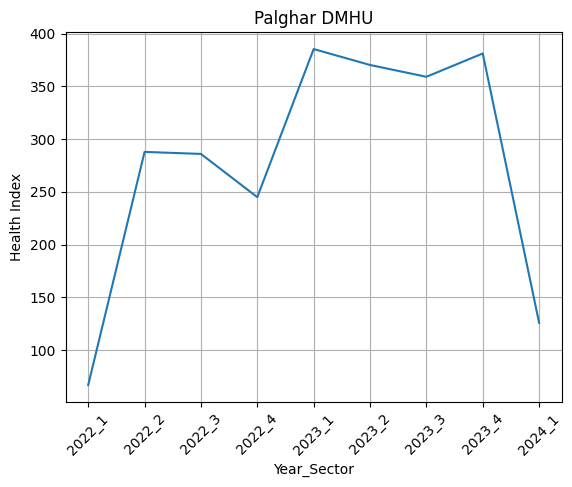

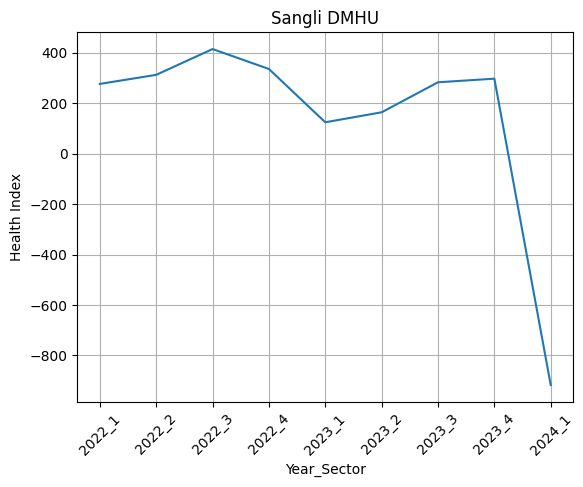

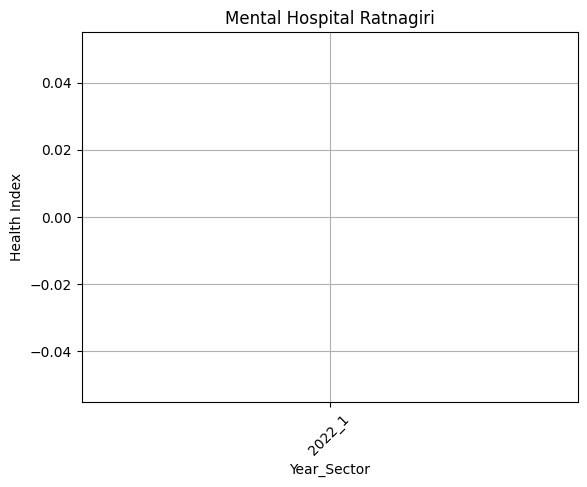

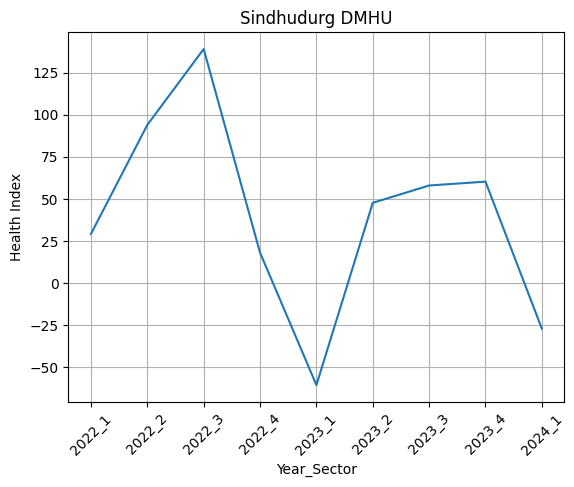

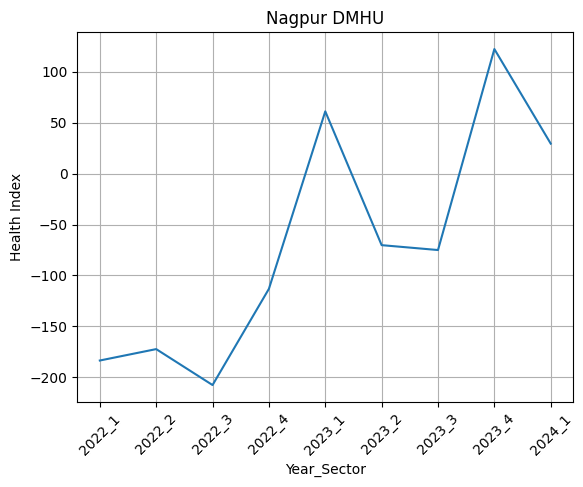

...

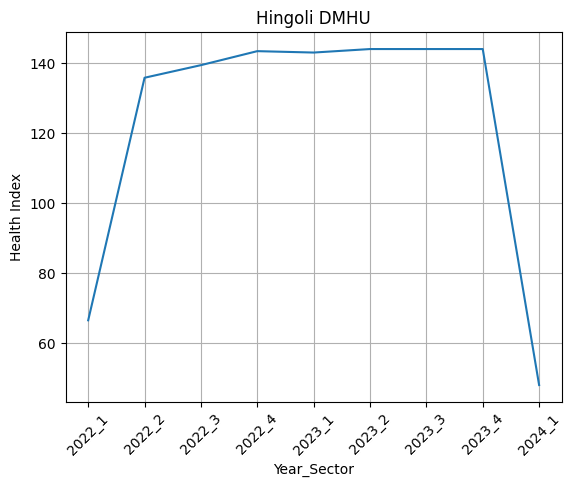

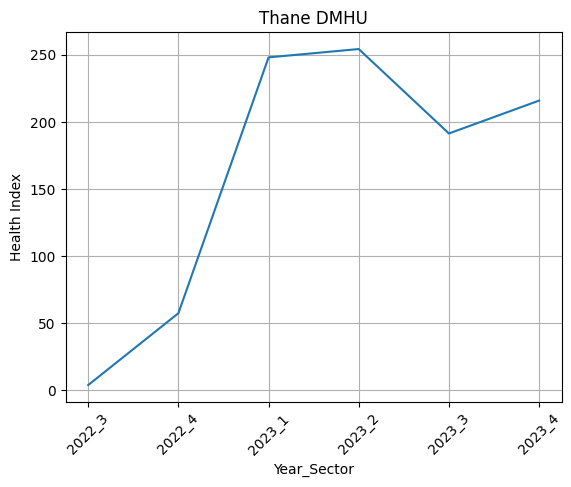

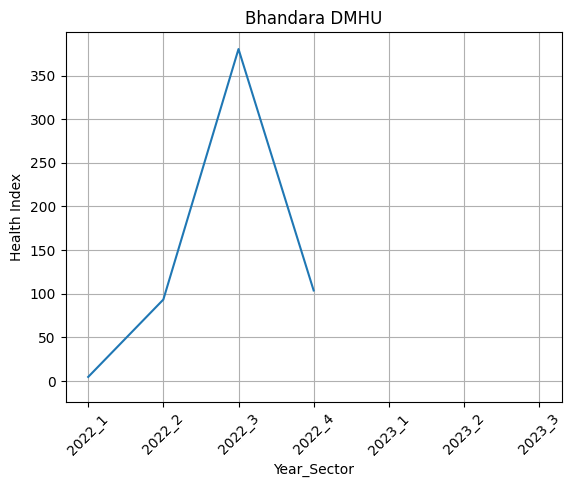

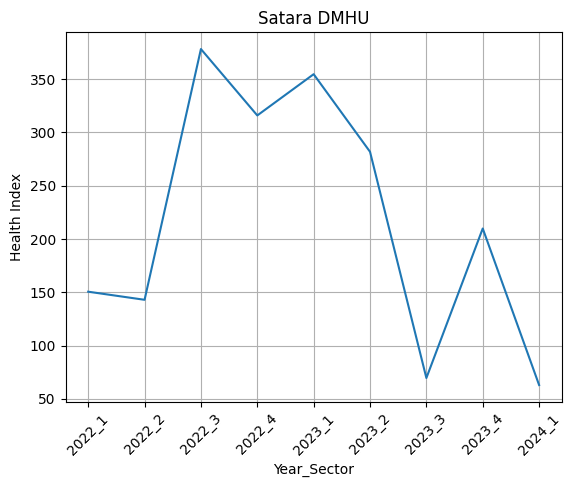

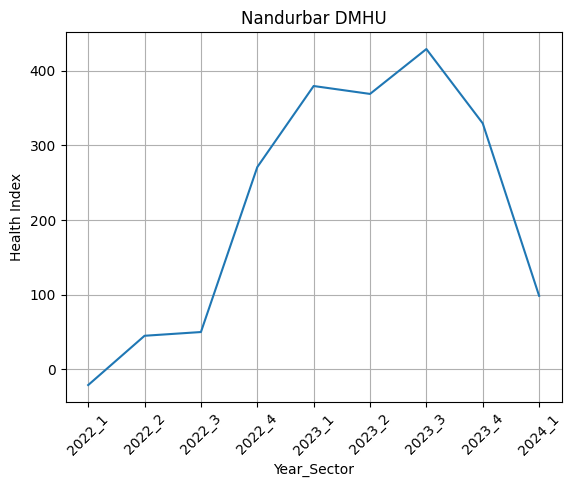

In [ ]:
Y = 'Health Index'
for district in district_list:
  graph(df, district, Y)

# **Variation of all paramaters vs District (average)**

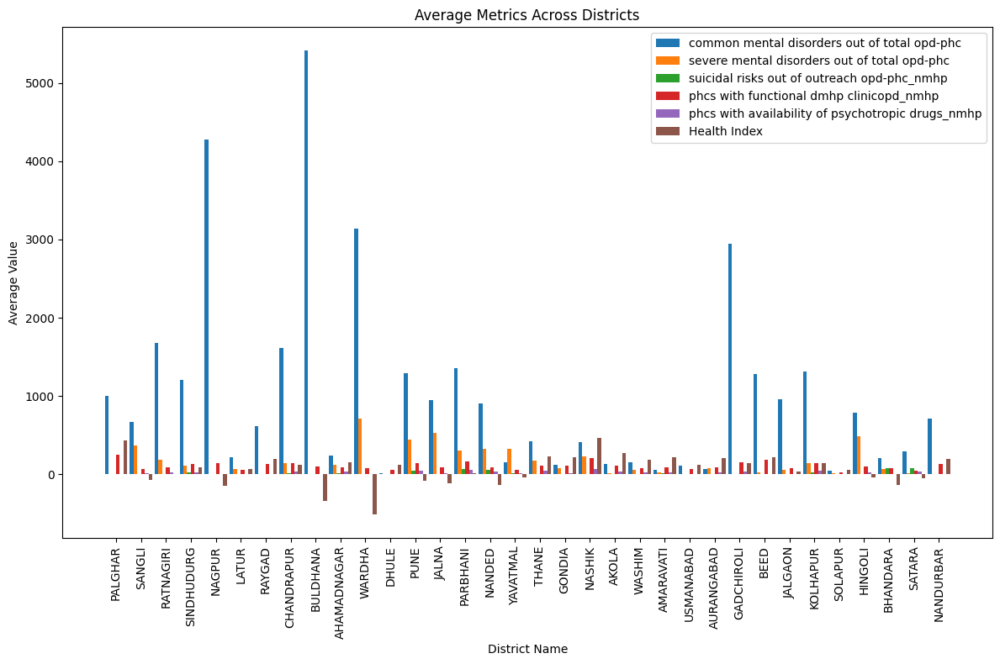

In [ ]:
# Specify the columns to plot
columns_to_plot = [
    'common mental disorders out of total opd-phc',
    'severe mental disorders out of total opd-phc',
    'suicidal risks out of outreach opd-phc_nmhp',
    'phcs with functional dmhp clinicopd_nmhp',
    'phcs with availability of psychotropic drugs_nmhp',
    'Health Index'
]

# Initialize lists to store average values for each column
average_values = []

# Calculate average values for each column
for column in columns_to_plot:
    average_value = df.groupby('organisationunitname')[column].mean().values
    average_values.append(average_value)

# Plotting
plt.figure(figsize=(12, 8))
num_metrics = len(columns_to_plot)
bar_width = 0.15
index = np.arange(len(district_list))

for i in range(num_metrics):
    plt.bar(index + i * bar_width, average_values[i], bar_width, label=columns_to_plot[i])

plt.xlabel('District Name')
plt.ylabel('Average Value')
plt.title('Average Metrics Across Districts')
plt.xticks(index + bar_width * (num_metrics - 1) / 2, district_list, rotation=90)
plt.legend()
plt.tight_layout()
plt.show()


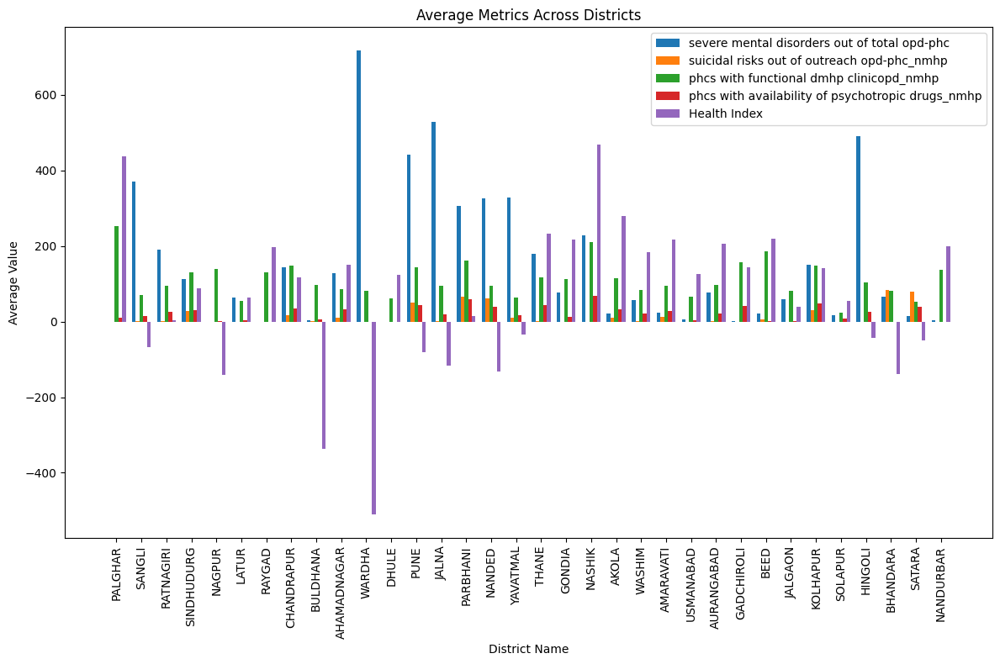

In [ ]:
import numpy as np

# Specify the columns to plot
columns_to_plot = [
    'severe mental disorders out of total opd-phc',
    'suicidal risks out of outreach opd-phc_nmhp',
    'phcs with functional dmhp clinicopd_nmhp',
    'phcs with availability of psychotropic drugs_nmhp',
    'Health Index'
]

# Initialize lists to store average values for each column
average_values = []

# Calculate average values for each column
for column in columns_to_plot:
    average_value = df.groupby('organisationunitname')[column].mean().values
    average_values.append(average_value)

# Plotting
plt.figure(figsize=(12, 8))
num_metrics = len(columns_to_plot)
bar_width = 0.15
index = np.arange(len(district_list))

for i in range(num_metrics):
    plt.bar(index + i * bar_width, average_values[i], bar_width, label=columns_to_plot[i])

plt.xlabel('District Name')
plt.ylabel('Average Value')
plt.title('Average Metrics Across Districts')
plt.xticks(index + bar_width * (num_metrics - 1) / 2, district_list, rotation=90)
plt.legend()
plt.tight_layout()
plt.show()

# **Normalised Graph (value between 0 and 1 for each paramater)**

In [ ]:
columns_for_graph = [
    # 'common mental disorders out of total opd-phc',
    # 'severe mental disorders out of total opd-phc',
    # 'suicidal risks out of outreach opd-phc_nmhp',
    'phcs with functional dmhp clinicopd_nmhp',
    'phcs with availability of psychotropic drugs_nmhp',
]

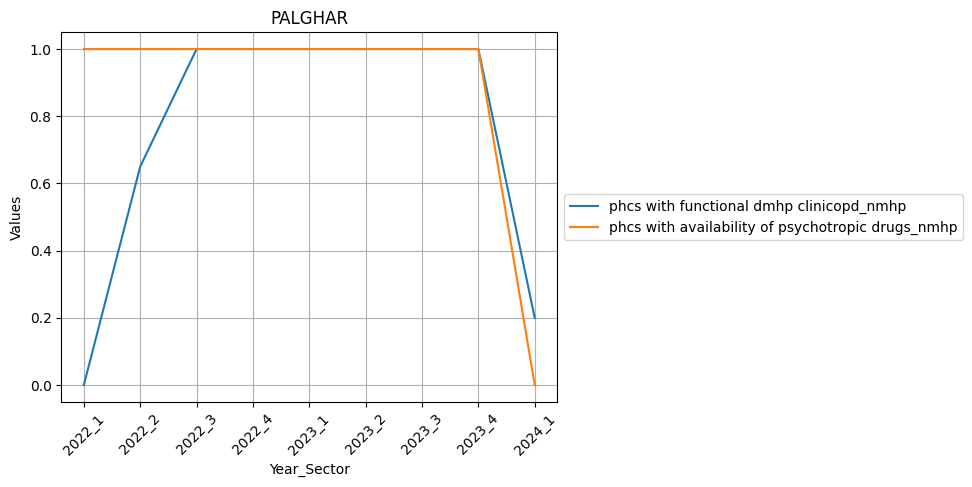

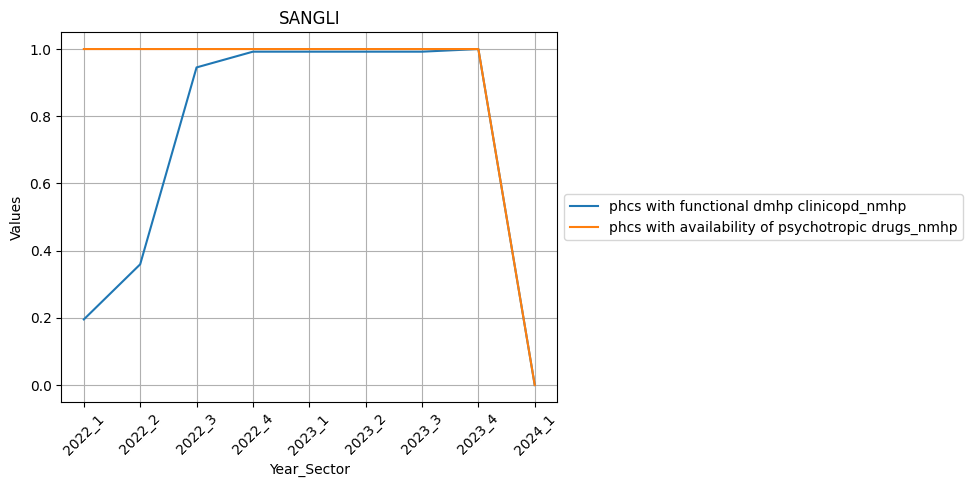

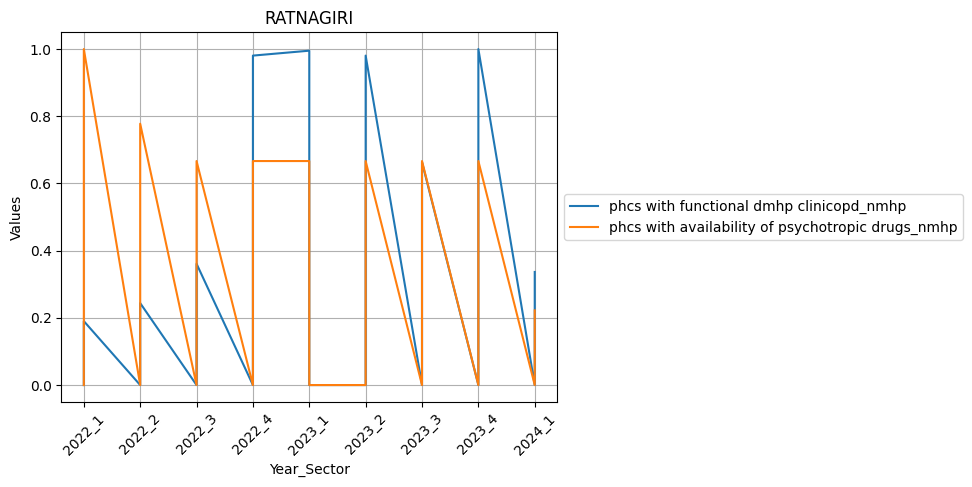

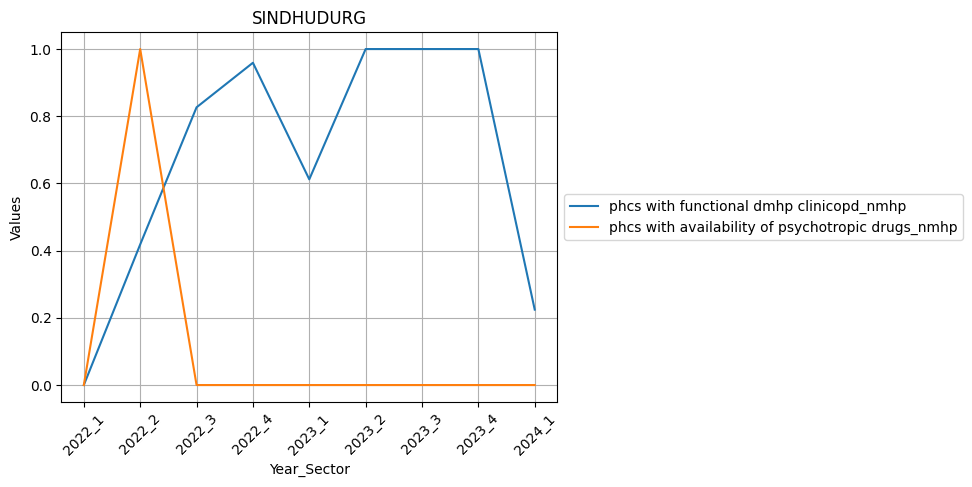

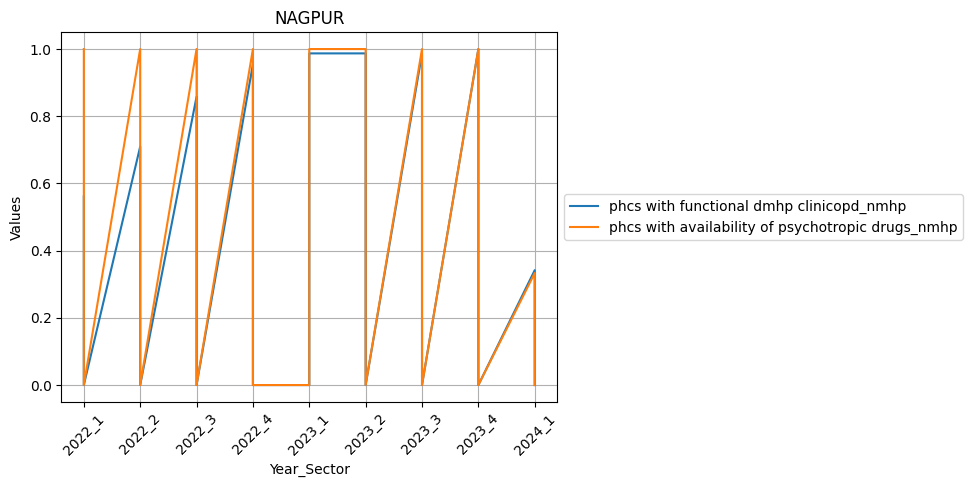

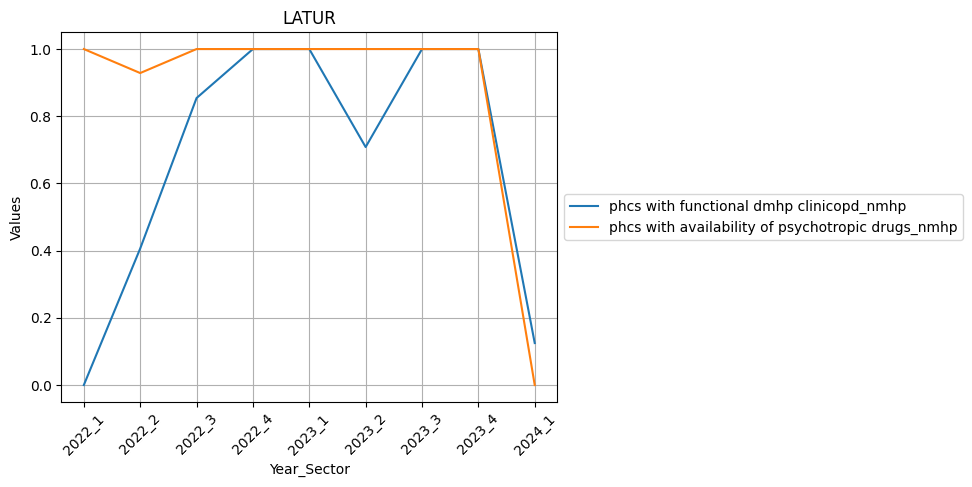

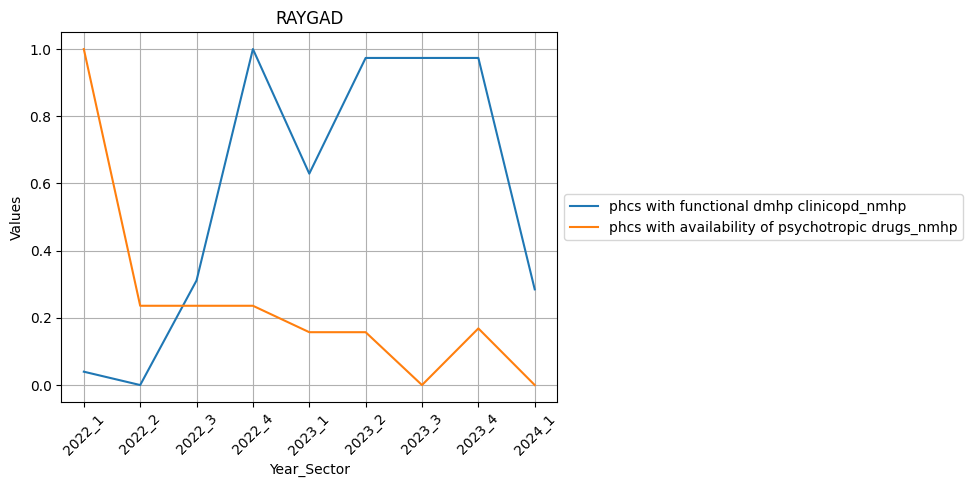

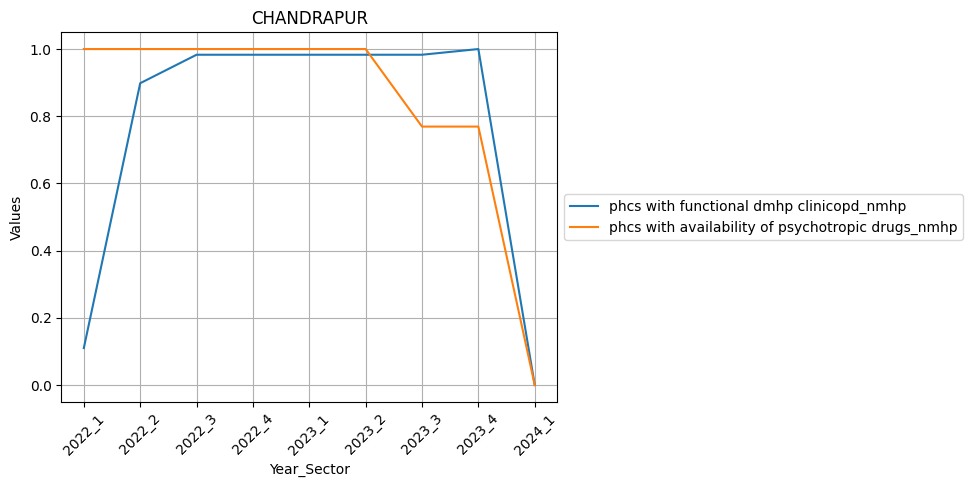

<ipython-input-112-d9a92d473f73>:11: RuntimeWarning: divide by zero encountered in divide
  y_normalized = (y - np.min(y)) / (np.max(y) - np.min(y))
<ipython-input-112-d9a92d473f73>:11: RuntimeWarning: invalid value encountered in divide
  y_normalized = (y - np.min(y)) / (np.max(y) - np.min(y))


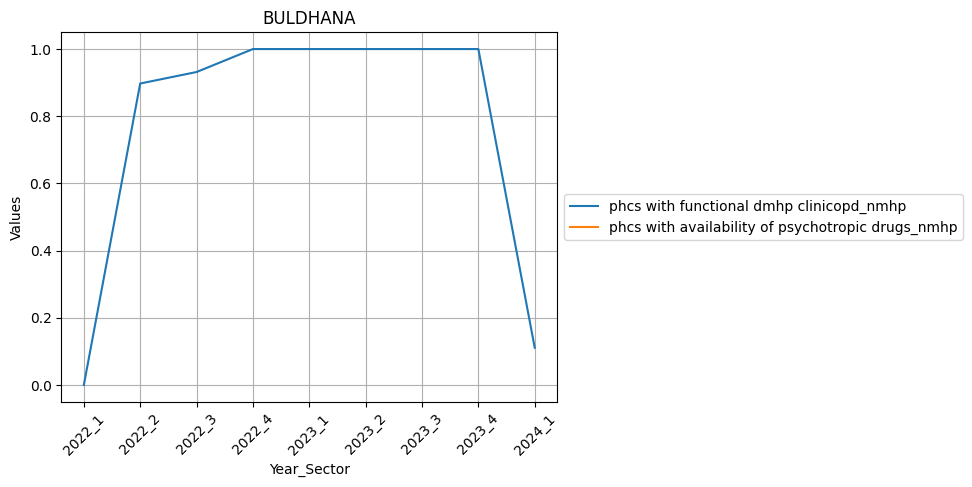

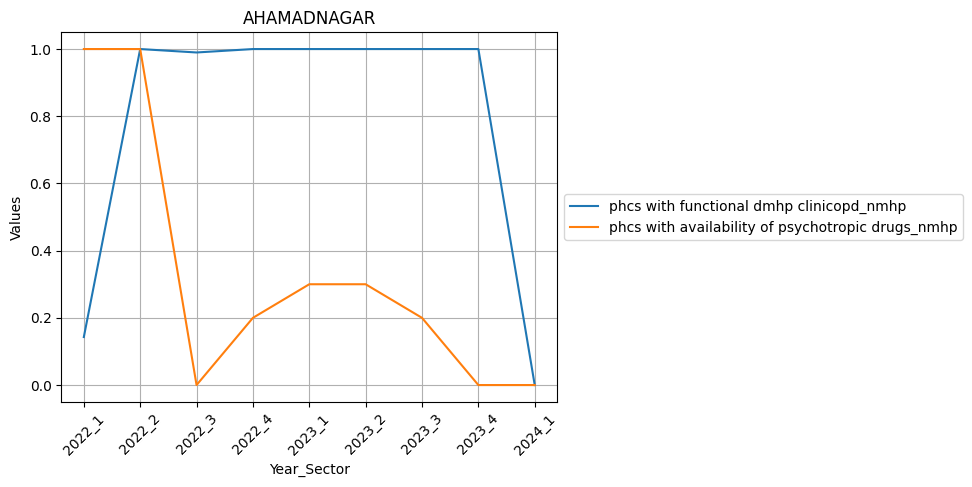

<ipython-input-112-d9a92d473f73>:11: RuntimeWarning: divide by zero encountered in divide
  y_normalized = (y - np.min(y)) / (np.max(y) - np.min(y))
<ipython-input-112-d9a92d473f73>:11: RuntimeWarning: invalid value encountered in divide
  y_normalized = (y - np.min(y)) / (np.max(y) - np.min(y))


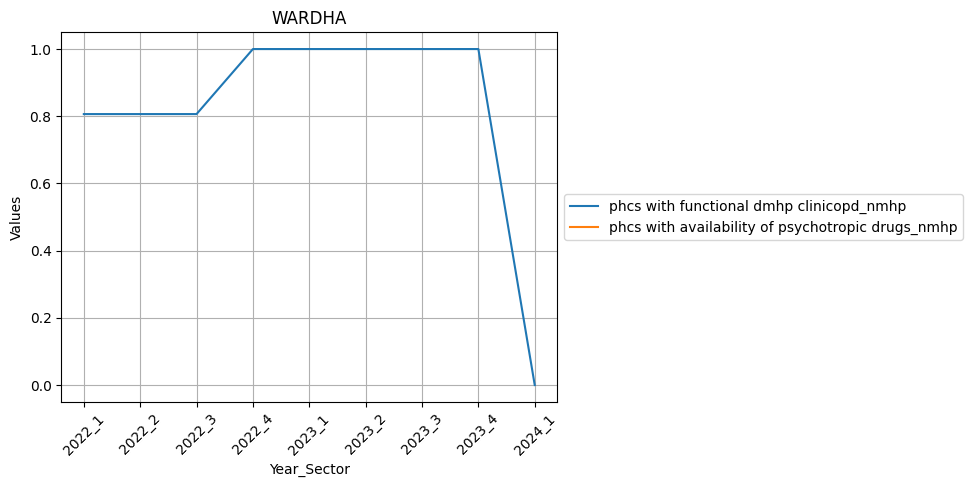

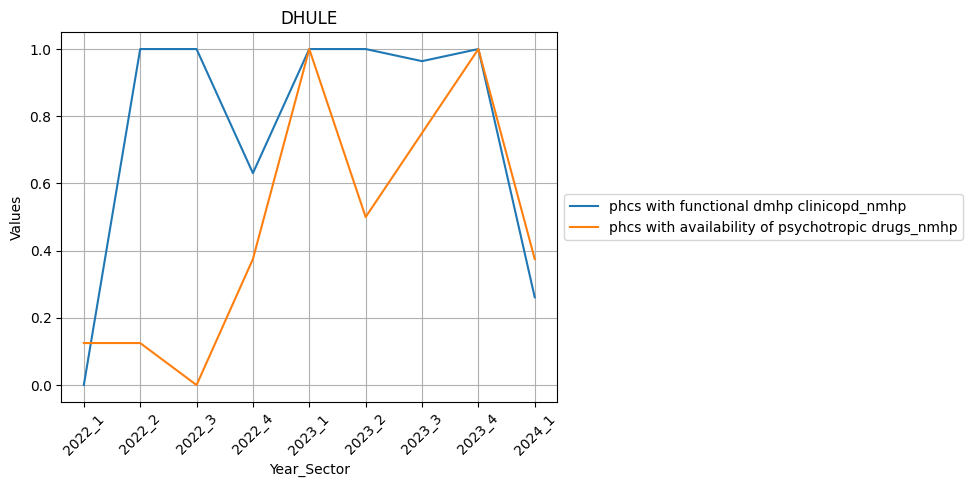

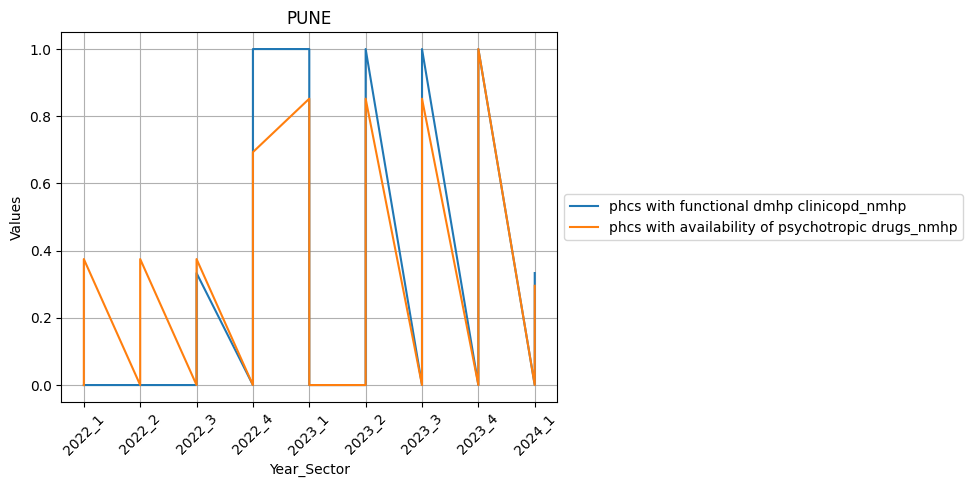

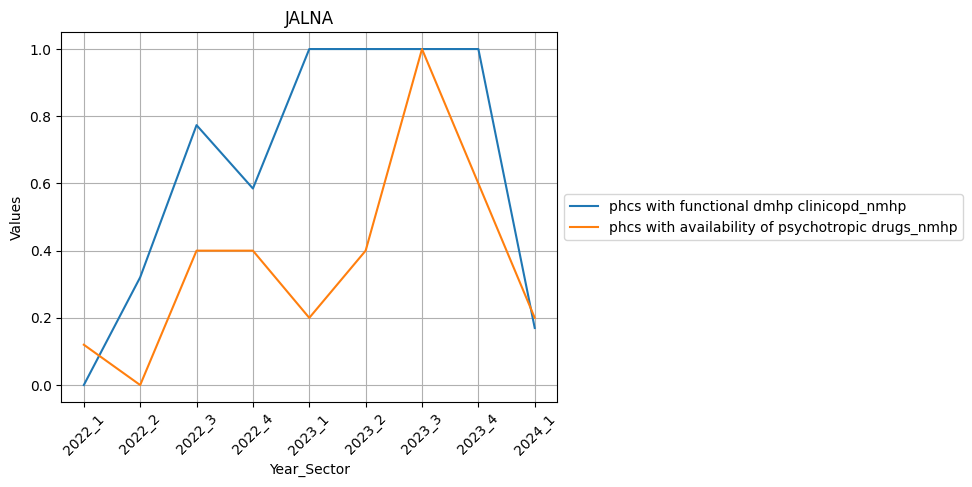

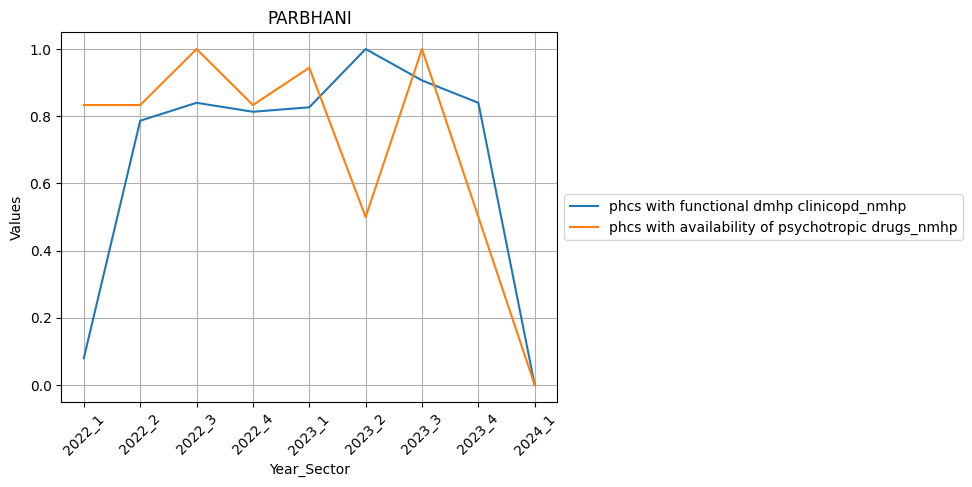

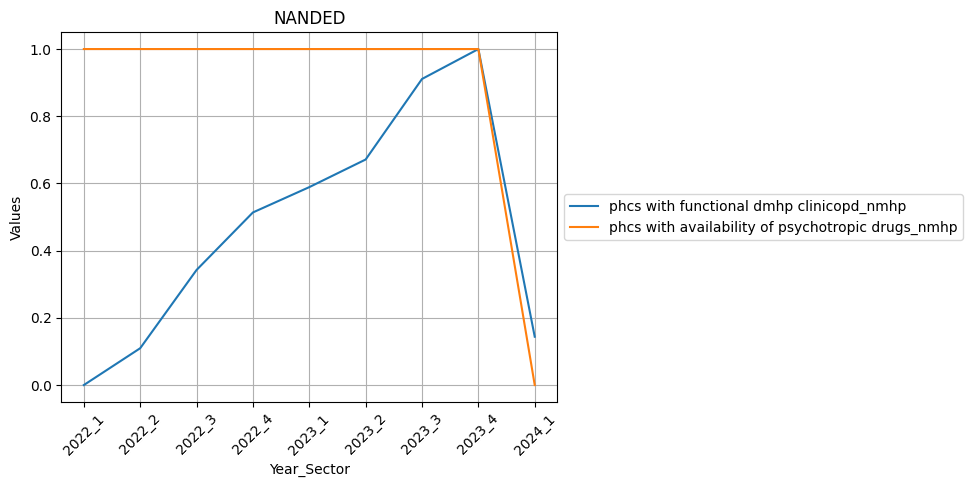

<ipython-input-112-d9a92d473f73>:11: RuntimeWarning: divide by zero encountered in divide
  y_normalized = (y - np.min(y)) / (np.max(y) - np.min(y))
<ipython-input-112-d9a92d473f73>:11: RuntimeWarning: invalid value encountered in divide
  y_normalized = (y - np.min(y)) / (np.max(y) - np.min(y))


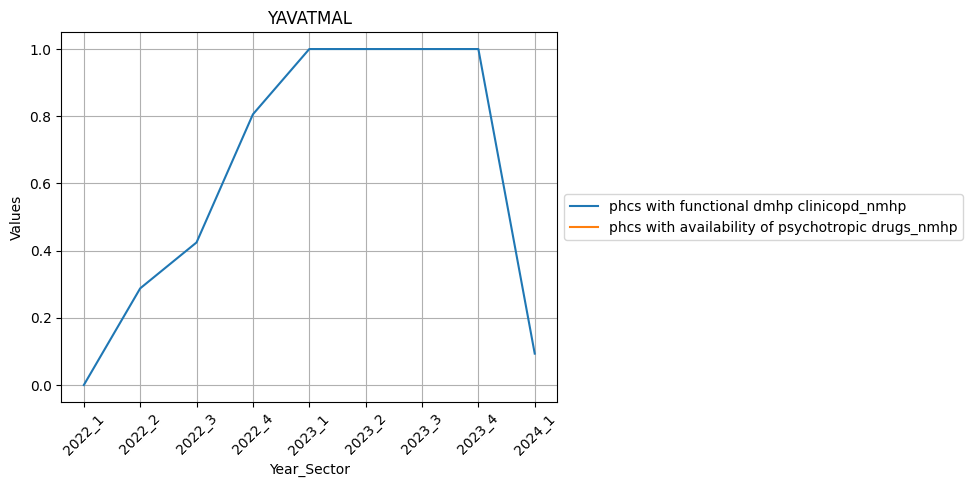

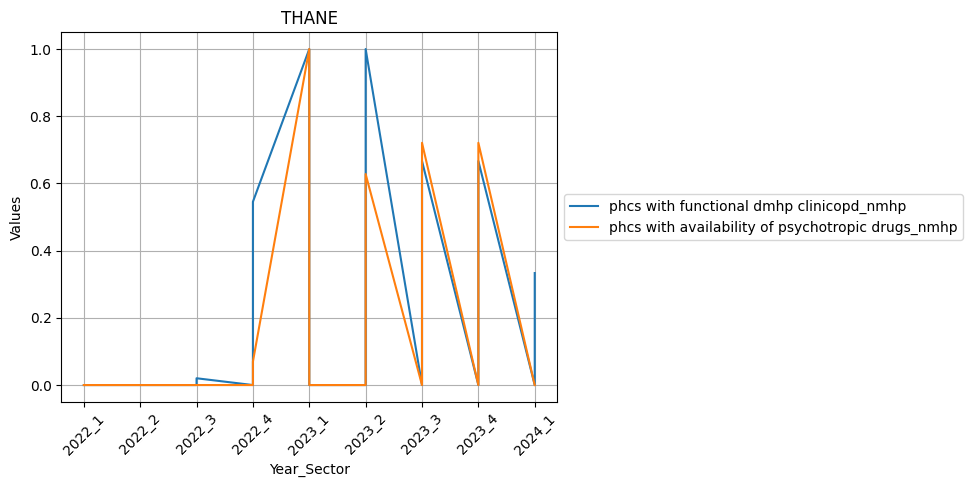

<ipython-input-112-d9a92d473f73>:11: RuntimeWarning: divide by zero encountered in divide
  y_normalized = (y - np.min(y)) / (np.max(y) - np.min(y))
<ipython-input-112-d9a92d473f73>:11: RuntimeWarning: invalid value encountered in divide
  y_normalized = (y - np.min(y)) / (np.max(y) - np.min(y))


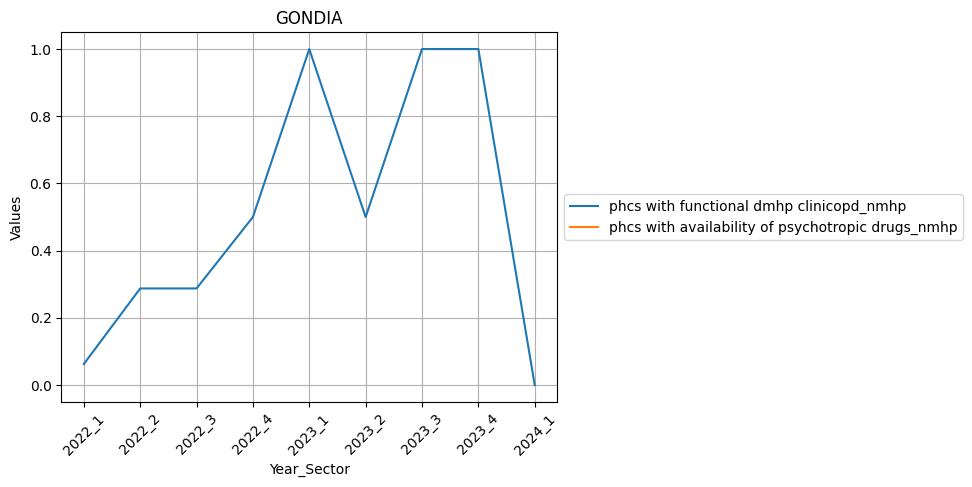

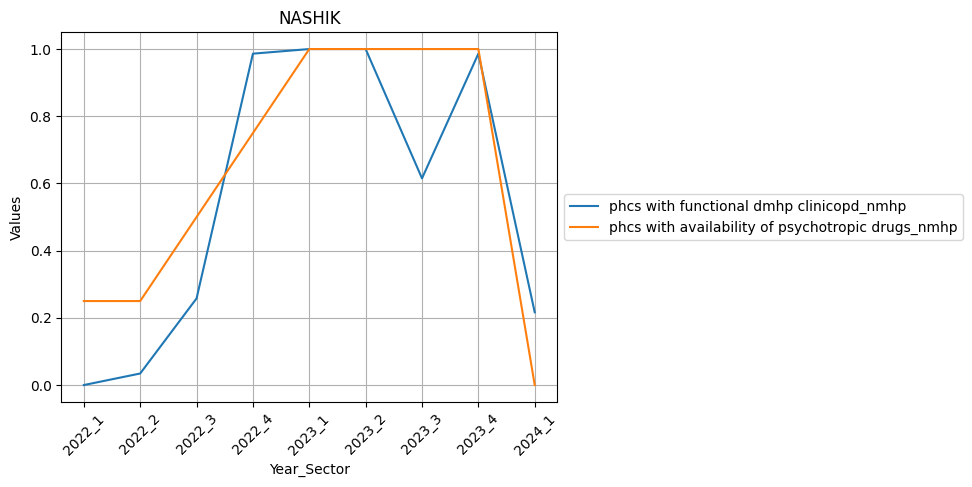

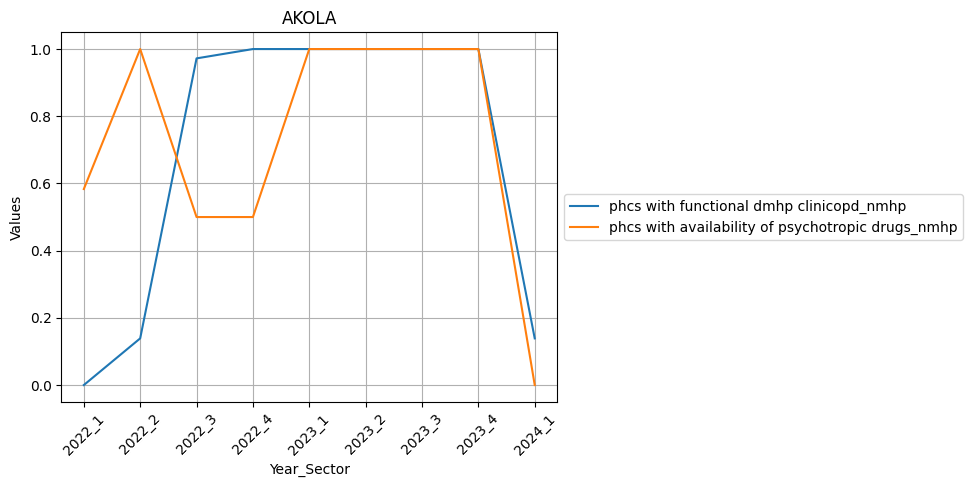

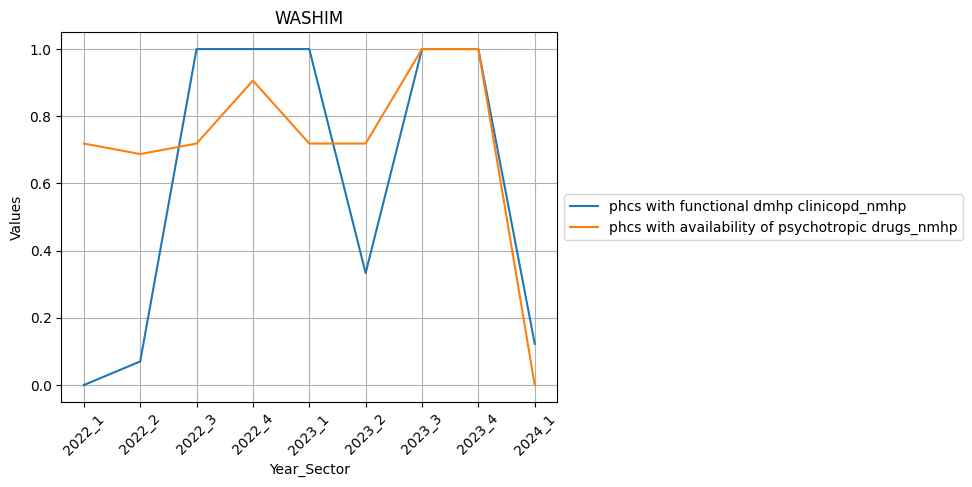

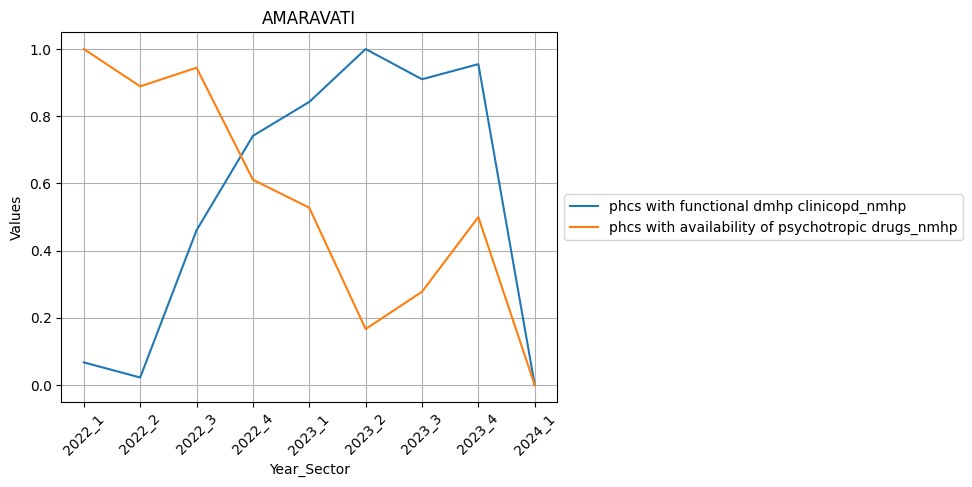

...

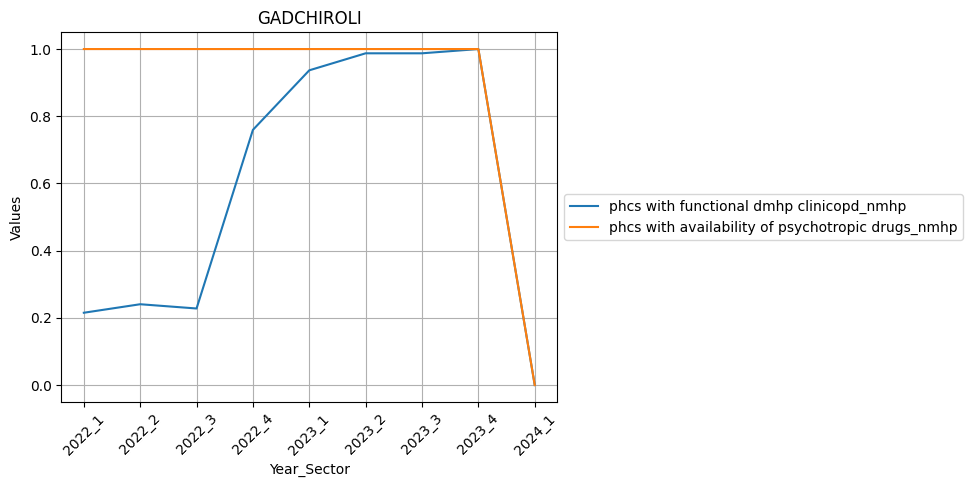

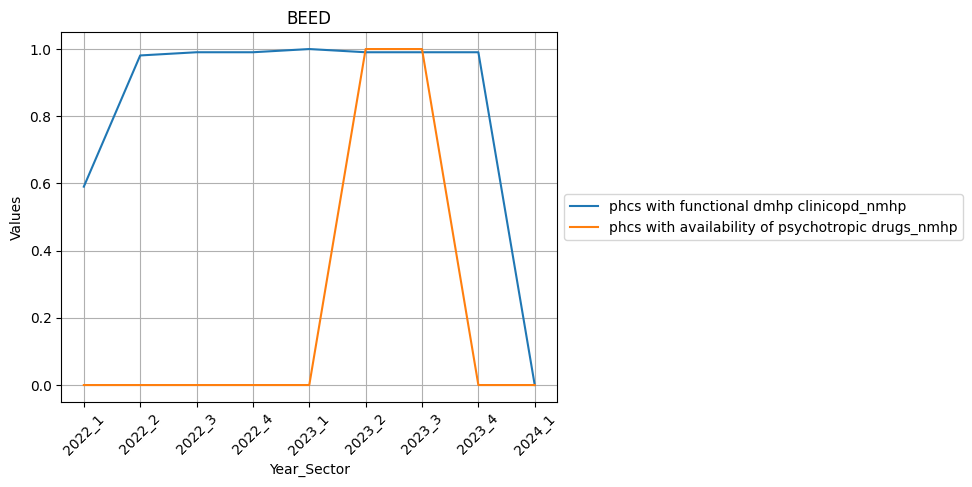

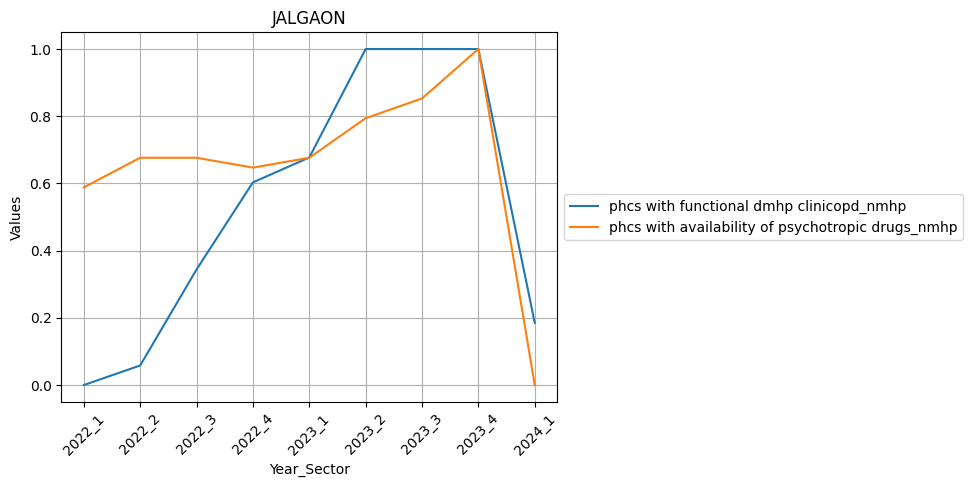

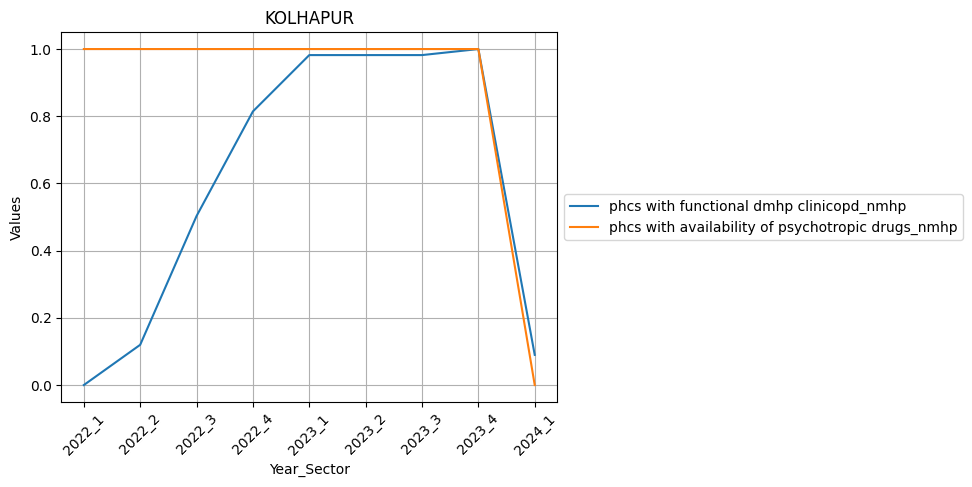

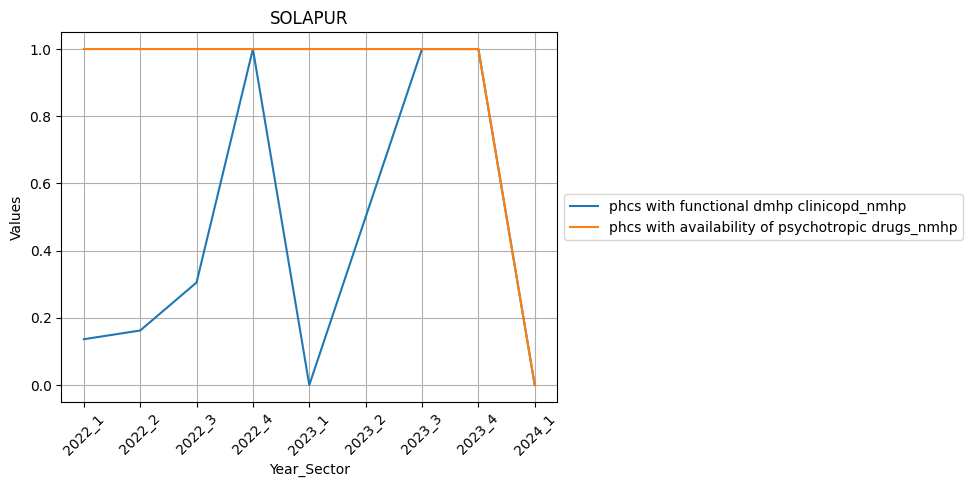

<ipython-input-112-d9a92d473f73>:11: RuntimeWarning: divide by zero encountered in divide
  y_normalized = (y - np.min(y)) / (np.max(y) - np.min(y))
<ipython-input-112-d9a92d473f73>:11: RuntimeWarning: invalid value encountered in divide
  y_normalized = (y - np.min(y)) / (np.max(y) - np.min(y))


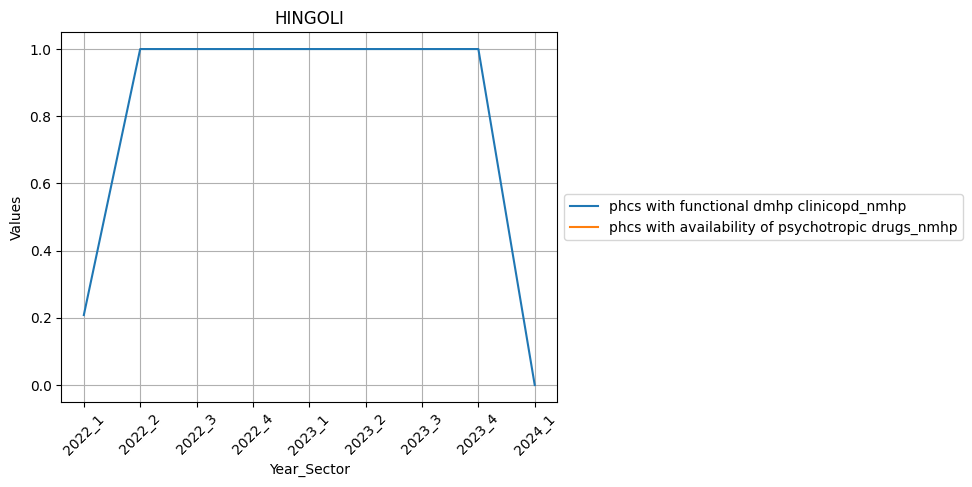

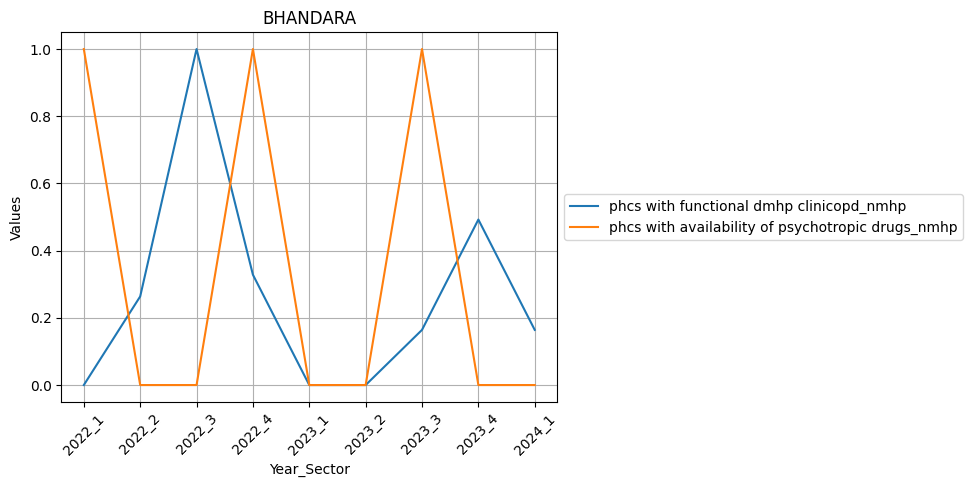

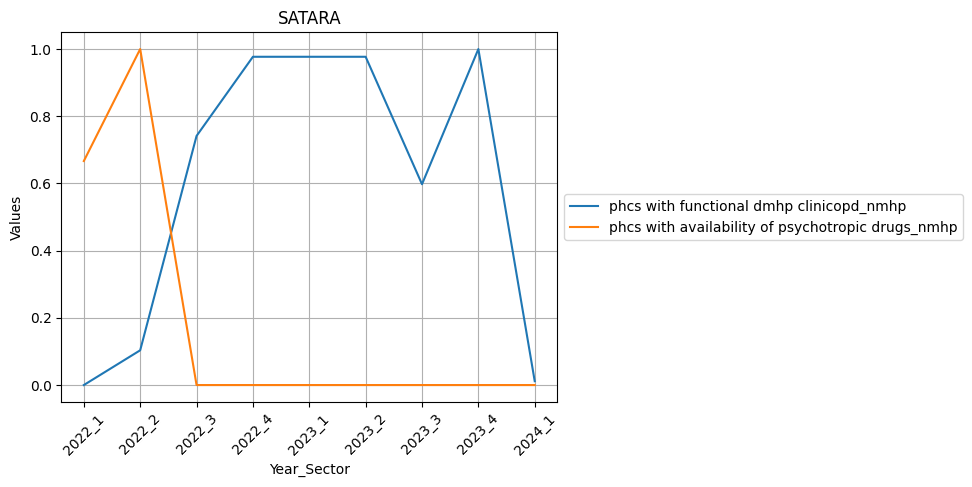

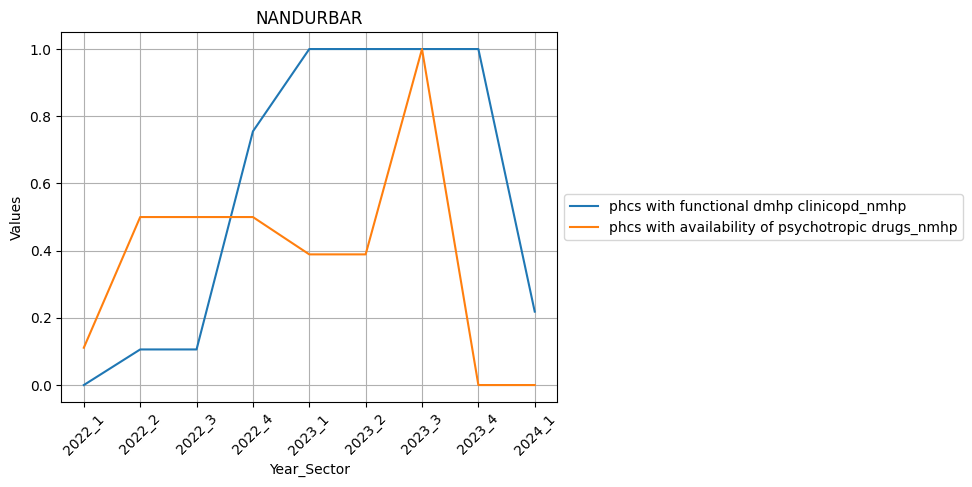

In [ ]:
for ditrict in district_list:
  all_graphs_normalised(df, ditrict, columns_for_graph)

# **Conclustion**

1. Spikes around end phases of 2022 and start phases of 2023 for mental health patients where as it decreased during 2024 phase 1
2. "phcs with availability of psychotropic drugs_nmhp" decreased in 2024 phase 1 compared to 2023 phase 4
3. 'phcs with functional dmhp clinicopd_nmhp' generally increased form 2022 phase 1 to 2023 phase 4 but decreased in 2024 phase 1
4. Health index graph varied for different districts, for few discticts it showed positive change and for few it showed negative change
5. Their has been somewhat similar variation between 'common mental disorders out of total opd-phc',
'severe mental disorders out of total opd-phc','suicidal risks out of outreach opd-phc_nmhp', for various districts
6. Few disctirct had similar variation for 'phcs with functional dmhp clinicopd_nmhp', 'phcs with availability of psychotropic drugs_nmhp'